In [1]:
import import_ipynb
import importlib

## AI Act and other documents Ingestion 

In [8]:
import os

import ingestion_utils
importlib.reload(ingestion_utils)
from ingestion_utils import *

file_name = "GDPR"
pdf_file = f"../data/raw_documents/pdf/{file_name}.pdf" # Replace with the actual path to your PDF
extracted_text = extract_text_pymupdf(pdf_file)

output_file_path = f"../data/clean_documents/{file_name}.txt"

# Ensure the directory exists
output_dir = os.path.dirname(output_file_path)
if output_dir and not os.path.exists(output_dir):
    os.makedirs(output_dir)
    print(f"Created directory: {output_dir}")


with open(output_file_path, "w", encoding="utf-8") as f:
    f.write(extracted_text)
print(f"Successfully extracted text and saved to: {output_file_path}")

Successfully extracted text and saved to: ../data/clean_documents/GDPR.txt


## AI ACT Chunking

## Semantic, Recursive, Naive 

Naïve (750 chunks) and Recursive (742 chunks) are almost identical in scale:
- Both aim for ~1 000 char chunks with ~200 char overlap.
- Recursive uses structural heuristics (paragraph/sentence breaks), so it often merges or splits similarly to the fixed‐length approach.

Semantic (2 348 chunks) is much higher because it:
- Splits wherever semantic similarity dips—so even fairly short, topically distinct sentences become their own chunk.

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\samue\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\samue\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\samue\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\samue\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\samue\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


[✔] Method: semantic → Created 2348 chunks.
[💾] Chunks saved to: ../data/chunks\ai_act_semantic_chunks.json
[✔] Method: naive → Created 750 chunks.
[💾] Chunks saved to: ../data/chunks\ai_act_naive_chunks.json
[✔] Method: recursive → Created 742 chunks.
[💾] Chunks saved to: ../data/chunks\ai_act_recursive_chunks.json


<Axes: xlabel='method'>

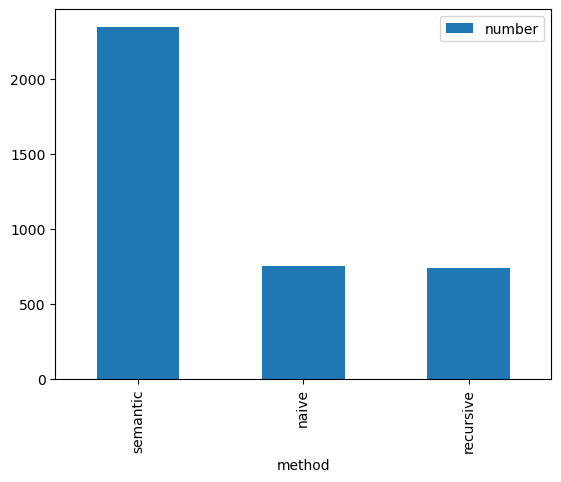

In [27]:
import chunking_utils
import pandas as pd

# import my custom function from utils notebook
import import_ipynb
import importlib
importlib.reload(chunking_utils)
from chunking_utils import *

output_file_path = "../data/clean_documents/ai_act_clean.txt"

with open(output_file_path, "r", encoding="utf-8") as f:
    ai_act_text = f.read()

chunks_number = {
    "method": [],
    "number": []
}

# Example: semantic chunking
method, number = chunk_text(ai_act_text, method="semantic", input_name="AI_Act", chunk_size=1000, similarity_threshold=0.75)

chunks_number["method"].append(method)
chunks_number["number"].append(number)

# Example: naive chunking
method, number = chunk_text(ai_act_text, method="naive", input_name="AI_Act", chunk_size=1000, overlap=200)

chunks_number["method"].append(method)
chunks_number["number"].append(number)

# Example: recursive chunking
method, number = chunk_text(ai_act_text, method="recursive", input_name="AI_Act", chunk_size=1000, chunk_overlap=200)

chunks_number["method"].append(method)
chunks_number["number"].append(number)

pd.DataFrame(chunks_number).plot(kind="bar", x="method", y="number")

## Chunking of AI Act Data Governance Article

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\samue\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\samue\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\samue\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\samue\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\samue\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\samue\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


[✔] Method: semantic → Created 509 chunks.
[💾] Chunks saved to: ../data/chunks/A_Robust_Governance_for_the_AI_Act\A_Robust_Governance_for_the_AI_Act_semantic_chunks.json
[✔] Method: naive → Created 122 chunks.
[💾] Chunks saved to: ../data/chunks/A_Robust_Governance_for_the_AI_Act\A_Robust_Governance_for_the_AI_Act_naive_chunks.json
[✔] Method: recursive → Created 123 chunks.
[💾] Chunks saved to: ../data/chunks/A_Robust_Governance_for_the_AI_Act\A_Robust_Governance_for_the_AI_Act_recursive_chunks.json


<Axes: xlabel='method'>

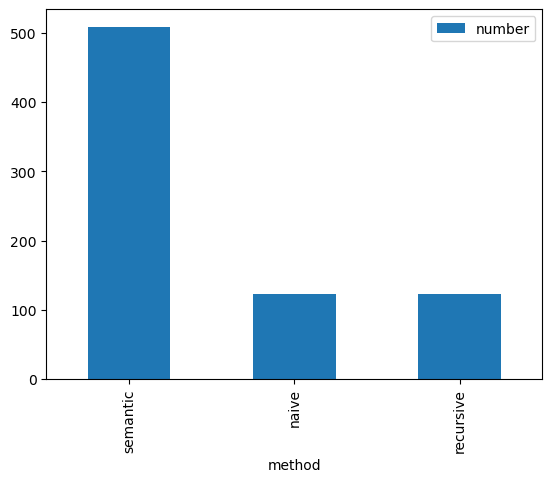

In [22]:
import chunking_utils
import pandas as pd

# import my custom function from utils notebook
import import_ipynb
import importlib
importlib.reload(chunking_utils)
from chunking_utils import *

output_file_path = "../data/clean_documents/A_Robust_Governance_for_the_AI_Act.txt"
input_name="A_Robust_Governance_for_the_AI_Act"

with open(output_file_path, "r", encoding="utf-8") as f:
    text = f.read()

chunks_number = {
    "method": [],
    "number": []
}

# Example: semantic chunking
method, number = chunk_text(text, method="semantic", input_name=input_name, chunk_size=1000, similarity_threshold=0.75)

chunks_number["method"].append(method)
chunks_number["number"].append(number)

# Example: naive chunking
method, number = chunk_text(text, method="naive", input_name=input_name, chunk_size=1000, overlap=200)

chunks_number["method"].append(method)
chunks_number["number"].append(number)

# Example: recursive chunking
method, number = chunk_text(text, method="recursive", input_name=input_name, chunk_size=1000, chunk_overlap=200)

chunks_number["method"].append(method)
chunks_number["number"].append(number)

pd.DataFrame(chunks_number).plot(kind="bar", x="method", y="number")

# GDPR Chunking

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\samue\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\samue\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\samue\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\samue\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\samue\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\samue\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


[✔] Method: semantic → Created 1466 chunks.
[💾] Chunks saved to: ../data/chunks/GDPR\GDPR_semantic_chunks.json
[✔] Method: naive → Created 452 chunks.
[💾] Chunks saved to: ../data/chunks/GDPR\GDPR_naive_chunks.json
[✔] Method: recursive → Created 443 chunks.
[💾] Chunks saved to: ../data/chunks/GDPR\GDPR_recursive_chunks.json


<Axes: xlabel='method'>

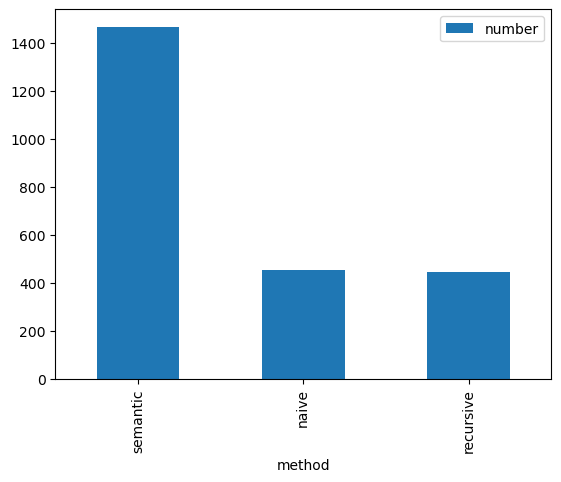

In [9]:
import chunking_utils
import pandas as pd

# import my custom function from utils notebook
import import_ipynb
import importlib
importlib.reload(chunking_utils)
from chunking_utils import *

file_name = "GDPR"
output_file_path = f"../data/clean_documents/{file_name}.txt"
input_name=file_name

with open(output_file_path, "r", encoding="utf-8") as f:
    text = f.read()

chunks_number = {
    "method": [],
    "number": []
}

# Example: semantic chunking
method, number = chunk_text(text, method="semantic", input_name=input_name, chunk_size=1000, similarity_threshold=0.75)

chunks_number["method"].append(method)
chunks_number["number"].append(number)

# Example: naive chunking
method, number = chunk_text(text, method="naive", input_name=input_name, chunk_size=1000, overlap=200)

chunks_number["method"].append(method)
chunks_number["number"].append(number)

# Example: recursive chunking
method, number = chunk_text(text, method="recursive", input_name=input_name, chunk_size=1000, chunk_overlap=200)

chunks_number["method"].append(method)
chunks_number["number"].append(number)

pd.DataFrame(chunks_number).plot(kind="bar", x="method", y="number")

## Improved with reference

In [134]:
import chunking_utils
import import_ipynb
import importlib
importlib.reload(chunking_utils)
from chunking_utils import *


xml_file = "../data/raw_documents/html/ai_act_lat.fmx.xml"

# Example: naive chunking
method, number, graph = chunk_text(xml_file, method="reference_graph")

print(f"Total number of chunks produced with method {method}: {number}")


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\samue\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!



Extracting 180 Recitals...


Processing Recitals:   0%|          | 0/180 [00:00<?, ?it/s]

skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping recitals
skipping r

Mapping Chapters:   0%|          | 0/13 [00:00<?, ?it/s]


Building map for 16 Sections...


Mapping Sections:   0%|          | 0/16 [00:00<?, ?it/s]


Extracting 113 Articles...


Processing Articles:   0%|          | 0/113 [00:00<?, ?it/s]


Extracting 13 Annexes...


Processing Annexes:   0%|          | 0/13 [00:00<?, ?it/s]


📥 Adding 0 Recital chunks (no subchunking).
📥 Subchunking 113 Articles if they exceed 2000 tokens.


Subchunking Articles:   0%|          | 0/113 [00:00<?, ?it/s]

Subchunking complete. Total chunks after subchunking: 114
📥 Adding 13 Annex chunks (no subchunking).

Building Reference Graph...


Building Graph:   0%|          | 0/127 [00:00<?, ?it/s]

📊 Reference graph built.

✅ Extraction complete: 127 total chunks.
[✔] Method: reference_graph → Created 127 chunks.
[💾] Chunks saved to: ../data/chunks\document_reference_graph_chunks.json
Total number of chunks produced with method reference_graph: 127


### Some statistics

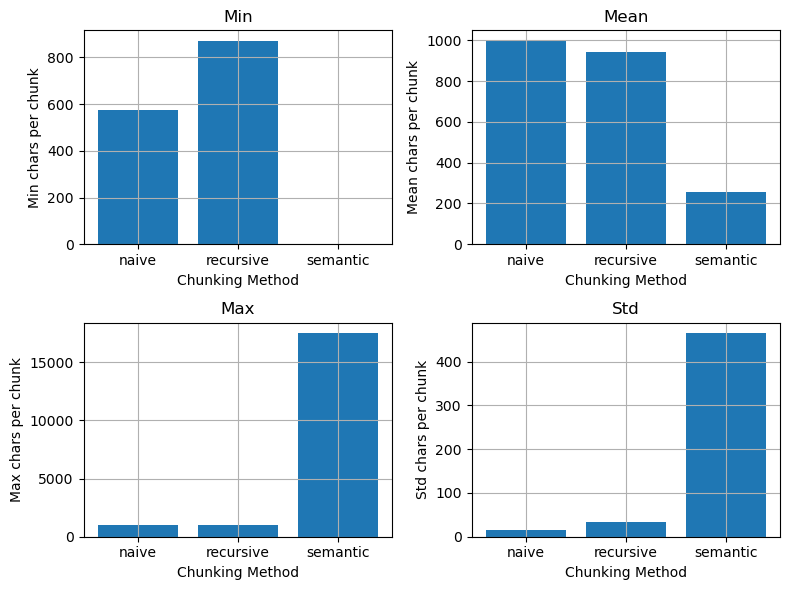

In [45]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

# ─── 1. Point to your chunk files here ──────────────────────────────────────
# Replace with your actual file locations:
files = {
    'naive':    '../data/chunks/ai_act_naive_chunks.json',
    'recursive':'../data/chunks/ai_act_recursive_chunks.json',
    'semantic': '../data/chunks/ai_act_semantic_chunks.json',
}

# ─── 2. Read & compute statistics for each chunk set ───────────────────────
stats = []
for method, path in files.items():
    if not os.path.exists(path):
        print(f"[!] File not found: {path}")
        continue

    with open(path, 'r', encoding='utf-8') as f:
        chunks = json.load(f)

    lengths = [len(c) for c in chunks]
    series = pd.Series(lengths, name=method)
    desc = series.describe()

    stats.append({
        'method': method,
        'min': desc['min'],
        'mean': desc['mean'],
        'max': desc['max'],
        'std': desc['std']
    })

# ─── 3. Build and display summary DataFrame ───────────────────────────────
summary_df = pd.DataFrame(stats)

# ─── 4. Plot four subplots: min, mean, max, std ───────────────────────────
metrics = ['min', 'mean', 'max', 'std']
fig, axs = plt.subplots(2, 2, figsize=(8, 6))
axs = axs.flatten()

for idx, metric in enumerate(metrics):
    axs[idx].bar(summary_df['method'], summary_df[metric])
    axs[idx].set_title(metric.capitalize())
    axs[idx].set_xlabel('Chunking Method')
    axs[idx].set_ylabel(f'{metric.capitalize()} chars per chunk')
    axs[idx].grid(True)

plt.tight_layout()
plt.show()

# Embedding: All Methods

In [135]:
import embedding_utils
importlib.reload(embedding_utils)
from embedding_utils import *

document_folder = "AI_Act"

from embedding_utils import build_and_persist_index_per_chunk_file
build_and_persist_index_per_chunk_file(
    chunk_json_dir=f"../data/chunks/{document_folder}",
    model_name="all-MiniLM-L6-v2",
    output_dir=f"../data/indexes/{document_folder}",
    batch_size=64
)


[INFO] Caricamento modello embedding 'all-MiniLM-L6-v2'...

[INFO] Elaborazione file chunk: ai_act_naive_chunks.json
[INFO] Trovati 750 chunk validi in 'ai_act_naive_chunks.json'
[INFO] Encoding 750 chunk in batch size=64...


Encoding ai_act_naive_chunks:   0%|          | 0/12 [00:00<?, ?it/s]

[INFO] Embedding matrix shape: (750, 384)
[INFO] Aggiungo embeddings a FAISS index (dim=384)...
[INFO] Salvati in '../data/indexes\ai_act_naive_chunks':
       - FAISS index: faiss_index_all-MiniLM-L6-v2.faiss
       - Metadata:    chunks_meta_all-MiniLM-L6-v2.pkl
       - Chunk vecs:  chunk_vecs_all-MiniLM-L6-v2.pkl

[INFO] Elaborazione file chunk: ai_act_recursive_chunks.json
[INFO] Trovati 742 chunk validi in 'ai_act_recursive_chunks.json'
[INFO] Encoding 742 chunk in batch size=64...


Encoding ai_act_recursive_chunks:   0%|          | 0/12 [00:00<?, ?it/s]

[INFO] Embedding matrix shape: (742, 384)
[INFO] Aggiungo embeddings a FAISS index (dim=384)...
[INFO] Salvati in '../data/indexes\ai_act_recursive_chunks':
       - FAISS index: faiss_index_all-MiniLM-L6-v2.faiss
       - Metadata:    chunks_meta_all-MiniLM-L6-v2.pkl
       - Chunk vecs:  chunk_vecs_all-MiniLM-L6-v2.pkl

[INFO] Elaborazione file chunk: ai_act_semantic_chunks.json
[INFO] Trovati 2348 chunk validi in 'ai_act_semantic_chunks.json'
[INFO] Encoding 2348 chunk in batch size=64...


Encoding ai_act_semantic_chunks:   0%|          | 0/37 [00:00<?, ?it/s]

[INFO] Embedding matrix shape: (2348, 384)
[INFO] Aggiungo embeddings a FAISS index (dim=384)...
[INFO] Salvati in '../data/indexes\ai_act_semantic_chunks':
       - FAISS index: faiss_index_all-MiniLM-L6-v2.faiss
       - Metadata:    chunks_meta_all-MiniLM-L6-v2.pkl
       - Chunk vecs:  chunk_vecs_all-MiniLM-L6-v2.pkl

[INFO] Elaborazione file chunk: document_reference_graph_chunks.json
[INFO] Trovati 127 chunk validi in 'document_reference_graph_chunks.json'
[INFO] Encoding 127 chunk in batch size=64...


Encoding document_reference_graph_chunks:   0%|          | 0/2 [00:00<?, ?it/s]

[INFO] Embedding matrix shape: (127, 384)
[INFO] Aggiungo embeddings a FAISS index (dim=384)...
[INFO] Salvati in '../data/indexes\document_reference_graph_chunks':
       - FAISS index: faiss_index_all-MiniLM-L6-v2.faiss
       - Metadata:    chunks_meta_all-MiniLM-L6-v2.pkl
       - Chunk vecs:  chunk_vecs_all-MiniLM-L6-v2.pkl

[✅] Tutti gli indici per ciascun file di chunk sono stati creati.


In [24]:
import embedding_utils
importlib.reload(embedding_utils)
from embedding_utils import *

document_folder = "A_Robust_Governance_for_the_AI_Act"

from embedding_utils import build_and_persist_index_per_chunk_file
build_and_persist_index_per_chunk_file(
    chunk_json_dir=f"../data/chunks/{document_folder}",
    model_name="all-MiniLM-L6-v2",
    output_dir=f"../data/indexes/{document_folder}",
    batch_size=64
)


[INFO] Caricamento modello embedding 'all-MiniLM-L6-v2'...

[INFO] Elaborazione file chunk: A_Robust_Governance_for_the_AI_Act_naive_chunks.json
[INFO] Trovati 122 chunk validi in 'A_Robust_Governance_for_the_AI_Act_naive_chunks.json'
[INFO] Encoding 122 chunk in batch size=64...


Encoding A_Robust_Governance_for_the_AI_Act_naive_chunks: 100%|██████████████████████████| 2/2 [00:03<00:00,  1.76s/it]


[INFO] Embedding matrix shape: (122, 384)
[INFO] Aggiungo embeddings a FAISS index (dim=384)...
[INFO] Salvati in '../data/indexes/A_Robust_Governance_for_the_AI_Act\A_Robust_Governance_for_the_AI_Act_naive_chunks':
       - FAISS index: faiss_index_all-MiniLM-L6-v2.faiss
       - Metadata:    chunks_meta_all-MiniLM-L6-v2.pkl
       - Chunk vecs:  chunk_vecs_all-MiniLM-L6-v2.pkl

[INFO] Elaborazione file chunk: A_Robust_Governance_for_the_AI_Act_recursive_chunks.json
[INFO] Trovati 123 chunk validi in 'A_Robust_Governance_for_the_AI_Act_recursive_chunks.json'
[INFO] Encoding 123 chunk in batch size=64...


Encoding A_Robust_Governance_for_the_AI_Act_recursive_chunks: 100%|██████████████████████| 2/2 [00:03<00:00,  1.64s/it]


[INFO] Embedding matrix shape: (123, 384)
[INFO] Aggiungo embeddings a FAISS index (dim=384)...
[INFO] Salvati in '../data/indexes/A_Robust_Governance_for_the_AI_Act\A_Robust_Governance_for_the_AI_Act_recursive_chunks':
       - FAISS index: faiss_index_all-MiniLM-L6-v2.faiss
       - Metadata:    chunks_meta_all-MiniLM-L6-v2.pkl
       - Chunk vecs:  chunk_vecs_all-MiniLM-L6-v2.pkl

[INFO] Elaborazione file chunk: A_Robust_Governance_for_the_AI_Act_semantic_chunks.json
[INFO] Trovati 509 chunk validi in 'A_Robust_Governance_for_the_AI_Act_semantic_chunks.json'
[INFO] Encoding 509 chunk in batch size=64...


Encoding A_Robust_Governance_for_the_AI_Act_semantic_chunks: 100%|███████████████████████| 8/8 [00:05<00:00,  1.33it/s]

[INFO] Embedding matrix shape: (509, 384)
[INFO] Aggiungo embeddings a FAISS index (dim=384)...
[INFO] Salvati in '../data/indexes/A_Robust_Governance_for_the_AI_Act\A_Robust_Governance_for_the_AI_Act_semantic_chunks':
       - FAISS index: faiss_index_all-MiniLM-L6-v2.faiss
       - Metadata:    chunks_meta_all-MiniLM-L6-v2.pkl
       - Chunk vecs:  chunk_vecs_all-MiniLM-L6-v2.pkl

[✅] Tutti gli indici per ciascun file di chunk sono stati creati.


In [10]:
import embedding_utils
importlib.reload(embedding_utils)
from embedding_utils import *

document_folder = "GDPR"

from embedding_utils import build_and_persist_index_per_chunk_file
build_and_persist_index_per_chunk_file(
    chunk_json_dir=f"../data/chunks/{document_folder}",
    model_name="all-MiniLM-L6-v2",
    output_dir=f"../data/indexes/{document_folder}",
    batch_size=64
)


[INFO] Caricamento modello embedding 'all-MiniLM-L6-v2'...

[INFO] Elaborazione file chunk: GDPR_naive_chunks.json
[INFO] Trovati 452 chunk validi in 'GDPR_naive_chunks.json'
[INFO] Encoding 452 chunk in batch size=64...


Encoding GDPR_naive_chunks: 100%|████████████████████████████████████████████████████████| 8/8 [00:05<00:00,  1.46it/s]


[INFO] Embedding matrix shape: (452, 384)
[INFO] Aggiungo embeddings a FAISS index (dim=384)...
[INFO] Salvati in '../data/indexes/GDPR\GDPR_naive_chunks':
       - FAISS index: faiss_index_all-MiniLM-L6-v2.faiss
       - Metadata:    chunks_meta_all-MiniLM-L6-v2.pkl
       - Chunk vecs:  chunk_vecs_all-MiniLM-L6-v2.pkl

[INFO] Elaborazione file chunk: GDPR_recursive_chunks.json
[INFO] Trovati 443 chunk validi in 'GDPR_recursive_chunks.json'
[INFO] Encoding 443 chunk in batch size=64...


Encoding GDPR_recursive_chunks: 100%|████████████████████████████████████████████████████| 7/7 [00:05<00:00,  1.39it/s]


[INFO] Embedding matrix shape: (443, 384)
[INFO] Aggiungo embeddings a FAISS index (dim=384)...
[INFO] Salvati in '../data/indexes/GDPR\GDPR_recursive_chunks':
       - FAISS index: faiss_index_all-MiniLM-L6-v2.faiss
       - Metadata:    chunks_meta_all-MiniLM-L6-v2.pkl
       - Chunk vecs:  chunk_vecs_all-MiniLM-L6-v2.pkl

[INFO] Elaborazione file chunk: GDPR_semantic_chunks.json
[INFO] Trovati 1466 chunk validi in 'GDPR_semantic_chunks.json'
[INFO] Encoding 1466 chunk in batch size=64...


Encoding GDPR_semantic_chunks: 100%|███████████████████████████████████████████████████| 23/23 [00:14<00:00,  1.54it/s]

[INFO] Embedding matrix shape: (1466, 384)
[INFO] Aggiungo embeddings a FAISS index (dim=384)...
[INFO] Salvati in '../data/indexes/GDPR\GDPR_semantic_chunks':
       - FAISS index: faiss_index_all-MiniLM-L6-v2.faiss
       - Metadata:    chunks_meta_all-MiniLM-L6-v2.pkl
       - Chunk vecs:  chunk_vecs_all-MiniLM-L6-v2.pkl

[✅] Tutti gli indici per ciascun file di chunk sono stati creati.


## Retrieval Test

In [24]:
import evaluation_utils
importlib.reload(evaluation_utils)
from evaluation_utils import *

import retrieval_utils
importlib.reload(retrieval_utils)
from retrieval_utils import *

# per chunk naive:
rsys_naive = RetrievalSystem(
    faiss_index_path="../data/indexes/ai_act_naive_chunks/faiss_index_all-MiniLM-L6-v2.faiss",
    meta_path="../data/indexes/ai_act_naive_chunks/chunks_meta_all-MiniLM-L6-v2.pkl",
    vecs_path="../data/indexes/ai_act_naive_chunks/chunk_vecs_all-MiniLM-L6-v2.pkl",
    graph_path=None,  # se esiste
    embedding_model_name="all-MiniLM-L6-v2"
)

# retrieval vettoriale:
for c in rsys_naive.retrieve_vector("Qual è la definizione di AI system secondo Articolo 3?", k=5):
    print(c["id"], c.get("type"), c.get("topic"), c["score"])
# retrieval + espansione:
res = rsys_naive.retrieve_and_expand("Conformity assessment Articolo 43", top_k=3, max_ref=2, mode="vector")
for c in res:
    print(c["id"], c.get("type"), c.get("topic"))


ai_act_naive_320 None None 1.172505259513855
ai_act_naive_708 None None 1.1999480724334717
ai_act_naive_710 None None 1.2026063203811646
ai_act_naive_101 None None 1.2075053453445435
ai_act_naive_1 None None 1.2082279920578003
ai_act_naive_717 None None
ai_act_naive_440 None None
ai_act_naive_718 None None


In [46]:
import evaluation_utils
importlib.reload(evaluation_utils)
from evaluation_utils import *

import retrieval_utils
importlib.reload(retrieval_utils)
from retrieval_utils import *

# per chunk reference_graph:
rsys_ref = RetrievalSystem(
    faiss_index_path="../data/indexes/document_reference_graph_chunks/faiss_index_all-MiniLM-L6-v2.faiss",
    meta_path="../data/indexes/document_reference_graph_chunks/chunks_meta_all-MiniLM-L6-v2.pkl",
    vecs_path="../data/indexes/document_reference_graph_chunks/chunk_vecs_all-MiniLM-L6-v2.pkl",
    graph_path="../data/indexes/document_reference_graph_chunks/graph_ai_act.pkl",
    embedding_model_name="all-MiniLM-L6-v2"
)

for c in rsys_ref.retrieve_vector("Which Is the definition of AI System according to the article 3?", k=5):
    print(c["id"], c.get("type"), c.get("topic"), c["score"])

print("####################################################################################")
res = rsys_ref.retrieve_and_expand("Which Is the definition of AI System according to the article 3?", top_k=3, max_ref=2, mode="vector")
for c in res:
    print(c["id"], c.get("type"), c.get("topic"))
    print(c['text'])

art_3.part_1 Article Definitions 0.6363173127174377
anx_VIII Annex ANNEX VIII 0.7887042760848999
anx_XII Annex ANNEX XII 0.7905573844909668
art_4 Article AI literacy 0.8130835890769958
anx_XI Annex ANNEX XI 0.8232545852661133
####################################################################################
[DEBUG] Recuperati 3 IDs iniziali: ['art_3.part_1', 'anx_VIII', 'anx_XII']
[DEBUG] Espansione con riferimenti per 3 IDs: ['art_3.part_1', 'anx_VIII', 'anx_XII']
[DEBUG] Riferimento trovato per art_3.part_1: art_2
[DEBUG] Riferimento trovato per art_3.part_1: art_2
[DEBUG] Riferimento trovato per art_3.part_1: art_9
[DEBUG] Riferimento trovato per art_3.part_1: art_10
[DEBUG] Riferimento trovato per art_3.part_1: art_10
[DEBUG] Riferimento trovato per art_3.part_1: art_4
[DEBUG] Riferimento trovato per art_3.part_1: art_4
[DEBUG] Riferimento trovato per art_3.part_1: art_4
[DEBUG] Riferimento trovato per art_3.part_1: art_57
[DEBUG] Riferimento trovato per art_3.part_1: art_2
[DEBU

In [18]:
from collections import Counter
types = [entry.get("type") for entry in rsys.meta]
print(Counter(types))
# Oppure, se usi source_file:
sources = [entry.get("source_file") for entry in rsys.meta]
print(Counter(sources))

Counter({None: 3840, 'Recital': 180, 'Article': 114, 'Annex': 13})
Counter({'ai_act_semantic_chunks.json': 2348, 'ai_act_naive_chunks.json': 750, 'ai_act_recursive_chunks.json': 742, 'document_reference_graph_chunks.json': 307})


# Retrieval Evaluation - Not Optimised
### Results:
Vector only finds the right chunk in the top 5 one third of the time.

BM25 alone never finds the exact answer_span in the keyword‐split chunks (likely because of punctuation or phrasing mismatches).

Hybrid (50/50) simply dilutes the vector signal with the no‐hit BM25 results, so it also fails entirely.

In [69]:
import evaluation_utils
importlib.reload(evaluation_utils)
from evaluation_utils import *

import retrieval_utils
importlib.reload(retrieval_utils)
from retrieval_utils import *

qa_benchmark_json = "../data/benchmarks/qa_benchmark.json"
embedding_model_name = "all-MiniLM-L6-v2"

with open(qa_benchmark_json) as json_data:
    qa_benchmark_data = json.load(json_data)

ai_act_qa_df = qa_df[qa_df["main_document"]=='AI Act']

rsys = RetrievalSystem(
    faiss_index_path="../data/indexes/faiss_index_all-MiniLM-L6-v2.faiss",
    meta_path="../data/indexes/embeddings_meta_all-MiniLM-L6-v2.pkl",
    embedding_model_name=embedding_model_name
)


# 4) Run evaluation for K=1 and K=5
results = []
for k in [1, 5]:
    recall = evaluate_recall_at_k(rsys, ai_act_qa_df, k=k)
    recall["K"] = k
    results.append(recall)

# 5) Tabulate and display
results_df = pd.DataFrame(results).set_index("K")
print("Recall@K Results:")
print(results_df)

Recall@K Results:
     vector  bm25    hybrid
K                          
1  0.000000   0.0  0.000000
5  0.076923   0.0  0.076923


## Investigating:
- missed questions
- top-5 retrieved chunk texts for each missed query
- check if the gold answer_span appears in any chunk


In [79]:
# 1) Load your QA benchmark and retrieval system as before
import json
import pandas as pd

import retrieval_utils
importlib.reload(retrieval_utils)
from retrieval_utils import *

import evaluation_utils
importlib.reload(evaluation_utils)
from evaluation_utils import * 

# Path to your benchmark
json_file = "../data/benchmarks/qa_benchmark.json"
with open(json_file, "r") as f:
    data = json.load(f)
qa_df = pd.DataFrame(data)

# Filter to AI Act only if desired
ai_act_qa_df = qa_df[qa_df["main_document"] == "AI Act"]

# Initialize retrieval system
rsys = RetrievalSystem(
    faiss_index_path="../data/indexes/faiss_index_all-MiniLM-L6-v2.faiss",
    meta_path="../data/indexes/embeddings_meta_all-MiniLM-L6-v2.pkl",
    embedding_model_name="all-MiniLM-L6-v2"
)

# 3) Run the inspection
inspect_missed_queries(rsys, ai_act_qa_df, k=5)

Inspecting top-5 retrievals for 11 questions...

Retrieving top-5 chunks for question #0 using vector retrieval...
Using relaxed matching for question #0...
Exact match found
✅ HIT: Question #0: 'Which article of the AI Act mandates a conformity assessment for high-risk AI systems?' → Found span in top-5 results.
   Gold span: ['Article 43']
   Matching chunk: Notified bodies shall verify the conformity of high-risk AI systems in accordance with the conformity assessment  procedures set out in Article 43.

Retrieving top-5 chunks for question #3 using vector retrieval...
Using relaxed matching for question #3...
Exact match found
✅ HIT: Question #3: "Which article of the AI Act defines the classification rules for 'high-risk AI systems'?" → Found span in top-5 results.
   Gold span: ['Article 6']
   Matching chunk: CHAPTER III HIGH-RISK AI SYSTEMS SECTION 1 Classification of AI systems as high-risk Article 6 Classification rules for high-risk AI systems 1.

Retrieving top-5 chunks for 

- Low Recall@1 and Recall@5 for vector and hybrid (BM25 also zero).
- Gold answer spans not matched in the top-K — even though the retriever gets semantically close (chunks clearly mention related content).
- In some cases, gold span doesn't exist in any chunk → labeling or chunking problem, not necessarily retrieval failure.
- In other cases, span does exist elsewhere → likely chunk boundary issue or overly strict matching.

1. Relaxing the Evaluation Logic

evaluate_recall_at_k probably requires an exact span in chunk["text"].This is too strict.
Use looser semantic match or keyword overlap. Or at least allow recital/article/annex labels like “Recital 10” to count as correct even if the span isn’t quoted directly.

##### Pseudocode inside evaluate_recall_at_k
def span_in_chunk(span, chunk_text):
    return span in chunk_text or span.lower() in chunk_text.lower() or fuzzy_match(span, chunk_text)

Or even simpler: if span is a label (like “Article 5”), check if any label string is in the retrieved chunk

2. Fix / Audit Gold Labels
The answer_span is too brief (e.g., "Recital 14") or too ambiguous / symbolic (e.g., "Annex III...") or doesn't appear anywhere,  not even outside top-K → these are annotation problems, not retrieval issues.

Possible solutions:
Updating the gold labels extending answer_span to a full sentence or paragraph or by including multiple valid spans (e.g., using "answer_spans": [span1, span2] in your JSON). If it's not possible to find the span in the document at all, flag it as invalid.

3. Running a new evaluation
4. Improve Chunking Strategy
moving from a fixed size or heuristic to a semantic unit splitting (articles, recitals, sections)
- Article/Recital-level for structured docs
- Using headings or HTML/XML tags as chunk boundaries
- Optionally overlap chunks to catch spans that span across

5. Adding debug metadata in retrieval output:
- chunk_id
- document_section (e.g., “Recital 14”)
- embedding_score (similarity)
This should help to get information like: “Was Recital 14 retrieved, just not high enough?”

In [78]:
import evaluation_utils
importlib.reload(evaluation_utils)
from evaluation_utils import * 

import retrieval_utils
importlib.reload(retrieval_utils)
from retrieval_utils import *

# Evaluate using relaxed matching
results = []
for k in [1, 5]:
    recall = evaluate_recall_at_k_relaxed(rsys, ai_act_qa_df, k=k)
    recall["K"] = k
    results.append(recall)

results_df = pd.DataFrame(results).set_index("K")
print("Relaxed Recall@K Results:")
print(results_df)


Exact match found
Exact match found
Exact match found
Exact match found
Exact match found
Exact match found
Exact match found
Exact match found
Reference label match found
Exact match found
Exact match found
Exact match found
Exact match found
Exact match found
Relaxed Recall@K Results:
     vector      bm25    hybrid
K                              
1  0.181818  0.000000  0.000000
5  0.363636  0.090909  0.181818


In [ ]:
html_file = "../data/raw_documents/html/ai_act_lat.fmx.xml"

# Evaluation - Optimised

In [1]:
import import_ipynb
import importlib

import evaluation_utils
importlib.reload(evaluation_utils)
from evaluation_utils import * 

import retrieval_utils
importlib.reload(retrieval_utils)
from retrieval_utils import *

import os
import pandas as pd
import numpy as np
from evaluation_utils import get_match_across_subspans
from retrieval_utils import RetrievalSystem

# 1) Definiamo i path alle sottocartelle di indexes
document_folder = "AI_Act"

base_indexes = f"../data/indexes/{document_folder}"
chunk_types = {
    "naive": {
        "index_path": os.path.join(base_indexes, "ai_act_naive_chunks", "faiss_index_all-MiniLM-L6-v2.faiss"),
        "meta_path":  os.path.join(base_indexes, "ai_act_naive_chunks", "chunks_meta_all-MiniLM-L6-v2.pkl"),
        "vecs_path":  os.path.join(base_indexes, "ai_act_naive_chunks", "chunk_vecs_all-MiniLM-L6-v2.pkl"),
        "graph_path": None
    },
    "recursive": {
        "index_path": os.path.join(base_indexes, "ai_act_recursive_chunks", "faiss_index_all-MiniLM-L6-v2.faiss"),
        "meta_path":  os.path.join(base_indexes, "ai_act_recursive_chunks", "chunks_meta_all-MiniLM-L6-v2.pkl"),
        "vecs_path":  os.path.join(base_indexes, "ai_act_recursive_chunks", "chunk_vecs_all-MiniLM-L6-v2.pkl"),
        "graph_path": None
    },
    "semantic": {
        "index_path": os.path.join(base_indexes, "ai_act_semantic_chunks", "faiss_index_all-MiniLM-L6-v2.faiss"),
        "meta_path":  os.path.join(base_indexes, "ai_act_semantic_chunks", "chunks_meta_all-MiniLM-L6-v2.pkl"),
        "vecs_path":  os.path.join(base_indexes, "ai_act_semantic_chunks", "chunk_vecs_all-MiniLM-L6-v2.pkl"),
        "graph_path": None
    },
    "reference_graph": {
        "index_path": os.path.join(base_indexes, "document_reference_graph_chunks", "faiss_index_all-MiniLM-L6-v2.faiss"),
        "meta_path":  os.path.join(base_indexes, "document_reference_graph_chunks", "chunks_meta_all-MiniLM-L6-v2.pkl"),
        "vecs_path":  os.path.join(base_indexes, "document_reference_graph_chunks", "chunk_vecs_all-MiniLM-L6-v2.pkl"),
        "graph_path": os.path.join(base_indexes, "document_reference_graph_chunks", "graph_ai_act.pkl")
    }
}


base_indexes = f"../data/indexes/{document_folder}"
chunk_types = {
    "naive": {
        "index_path": os.path.join(base_indexes, f"{document_folder.lower()}_naive_chunks", "faiss_index_all-MiniLM-L6-v2.faiss"),
        "meta_path":  os.path.join(base_indexes, f"{document_folder.lower()}_naive_chunks", "chunks_meta_all-MiniLM-L6-v2.pkl"),
        "vecs_path":  os.path.join(base_indexes, f"{document_folder.lower()}_naive_chunks", "chunk_vecs_all-MiniLM-L6-v2.pkl"),
        "graph_path": None
    },
    "recursive": {
        "index_path": os.path.join(base_indexes, f"{document_folder.lower()}_recursive_chunks", "faiss_index_all-MiniLM-L6-v2.faiss"),
        "meta_path":  os.path.join(base_indexes, f"{document_folder.lower()}_recursive_chunks", "chunks_meta_all-MiniLM-L6-v2.pkl"),
        "vecs_path":  os.path.join(base_indexes, f"{document_folder.lower()}_recursive_chunks", "chunk_vecs_all-MiniLM-L6-v2.pkl"),
        "graph_path": None
    },
    "semantic": {
        "index_path": os.path.join(base_indexes, f"{document_folder.lower()}_semantic_chunks", "faiss_index_all-MiniLM-L6-v2.faiss"),
        "meta_path":  os.path.join(base_indexes, f"{document_folder.lower()}_semantic_chunks", "chunks_meta_all-MiniLM-L6-v2.pkl"),
        "vecs_path":  os.path.join(base_indexes, f"{document_folder.lower()}_semantic_chunks", "chunk_vecs_all-MiniLM-L6-v2.pkl"),
        "graph_path": None
    },
    "reference_graph": {
            "index_path": os.path.join(base_indexes, "document_reference_graph_chunks", "faiss_index_all-MiniLM-L6-v2.faiss"),
            "meta_path":  os.path.join(base_indexes, "document_reference_graph_chunks", "chunks_meta_all-MiniLM-L6-v2.pkl"),
            "vecs_path":  os.path.join(base_indexes, "document_reference_graph_chunks", "chunk_vecs_all-MiniLM-L6-v2.pkl"),
            "graph_path": os.path.join(base_indexes, "document_reference_graph_chunks", "graph_ai_act.pkl")
        }
}

In [14]:
import evaluation_utils
importlib.reload(evaluation_utils)
from evaluation_utils import * 

import retrieval_utils
importlib.reload(retrieval_utils)
from retrieval_utils import *

import os
import pandas as pd
import numpy as np
from evaluation_utils import get_match_across_subspans
from retrieval_utils import RetrievalSystem


# 2) Carica il QA benchmark
import json
with open("../data/benchmarks/qa_benchmark.json", "r", encoding="utf-8") as f:
    data = json.load(f)
qa_df = pd.DataFrame(data)
ai_act_qa_df = qa_df[qa_df["main_document"] == "AI Act"].reset_index(drop=True)

print("AI ACT Q&A Benchmark dimension: ", len(ai_act_qa_df))

# 3) Funzione di evaluation per un singolo RetrievalSystem e modalità
def evaluate_method_on_qa(rsys, qa_df, mode: str, k: int = 5):
    total = len(qa_df)
    hits = 0
    scores_matched = []
    for _, row in ai_act_qa_df.iterrows():
        q = row["question"]
        gold_spans = row["answer_span"]  # lista di sub-span
        # 1) recupero top-K
        if mode == "vector":
            results = rsys.retrieve_vector(q, k=k)
        
        elif mode == "bm25":
            results = rsys.retrieve_bm25(q, k=k)
        
        elif mode == "hybrid":
            results = rsys.retrieve_hybrid(q, k=k)

        elif mode == "hybrid_rrf":
            results = rsys.retrieve_hybrid_rrf(q, k=k)
        
        elif mode == "expand":
            # usa retrieve_and_expand: top_k iniziale=k, max_ref=2 (o diverso se vuoi)
            results = rsys.retrieve_and_expand(q, top_k=k, max_ref=2, mode="vector")

        elif mode == "hyde":
            results = rsys.retrieve_hyde(q, k=k)
        
        else:
            raise ValueError(f"Mode sconosciuto: {mode}")

        # 2) verifica relaxed match
        matched = get_match_across_subspans(gold_spans, results)
        if matched:
            hits += 1
            # raccogli punteggi dei chunk matching
            match_scores = []
            for chunk in results:
                for sub in gold_spans:
                    # per semplicità: controllo substring (potresti usare relaxed_span_match se preferisci)
                    if sub in chunk["text"] or sub.lower() in chunk["text"].lower():
                        if chunk.get("score") is not None:
                            match_scores.append(chunk["score"])
                        break
            if match_scores:
                scores_matched.append(np.mean(match_scores))
    recall = hits / total
    avg_score_hit = np.mean(scores_matched) if scores_matched else None
    return {"recall": recall, "avg_score_hit": avg_score_hit}

# 4) Loop sui tipi di chunk e modalità di retrieval
K = 5
rows = []
for chunk_type, paths in chunk_types.items():
    print(f"\n>>> Evaluating chunk type: {chunk_type}")
    # Istanzia RetrievalSystem con i path corretti
    rsys = RetrievalSystem(
        faiss_index_path=paths["index_path"],
        meta_path=paths["meta_path"],
        vecs_path=paths["vecs_path"],
        graph_path=paths["graph_path"],
        embedding_model_name="all-MiniLM-L6-v2"
    )
    # Definiamo le modalità da testare: vector, bm25, hybrid; aggiungiamo 'expand' solo se reference_graph
    modes = ["vector", "bm25", "hybrid", "hybrid_rrf"] # "hyde"
    
    if chunk_type == "reference_graph":
        modes.append("expand")
    for mode in modes:
        print(f"- modalità {mode} ...")
        res = evaluate_method_on_qa(rsys, ai_act_qa_df, mode=mode, k=K)
        rows.append({
            "chunk_type": chunk_type,
            "mode": mode,
            "recall": res["recall"],
            "avg_score_hit": res["avg_score_hit"]
        })

# 5) Costruisci DataFrame riepilogo e pivot per recall
results_df = pd.DataFrame(rows)
pivot_recall = results_df.pivot(index="chunk_type", columns="mode", values="recall")
pivot_score = results_df.pivot(index="chunk_type", columns="mode", values="avg_score_hit")

print("\nRecall@K pivot table:")
print(pivot_recall)
print("\nAvg matched-score pivot table:")
print(pivot_score)


AI ACT Q&A Benchmark dimension:  13

>>> Evaluating chunk type: naive
- modalità vector ...
--------------------------------------------------------------------------------
No match found for span: Article 5 in chunk: d justice. Such AI systems evaluate or classify natural persons or groups thereof on the basis of 
multiple data points related to their social behaviour in multiple contexts or known, inferred or predicted personal 
or personality characteristics over certain periods of time. The social score obtained from such AI systems may lead 
to the detrimental or unfavourable treatment of natural persons or whole groups thereof in social contexts, which 
are unrelated to the context in which the data was originally generated or collected or to a detrimental treatment that 
is disproportionate or unjustified to the gravity of their social behaviour. AI systems entailing such unacceptable 
scoring practices and leading to such detrimental or unfavourable outcomes should therefore be

In [12]:
import evaluation_utils
importlib.reload(evaluation_utils)
from evaluation_utils import * 

import retrieval_utils
importlib.reload(retrieval_utils)
from retrieval_utils import *

import gemini_utils
importlib.reload(gemini_utils)
from gemini_utils import *

import os
import pandas as pd
import numpy as np
from evaluation_utils import get_match_across_subspans
from retrieval_utils import RetrievalSystem


generate_gemini_content("Hi How are you?")

'I am doing well, thank you for asking! How are you today?\n'

## Evaluation in DEEP and Performance Plotting

In [2]:
import evaluation_utils
importlib.reload(evaluation_utils)
from evaluation_utils import *

import retrieval_utils
importlib.reload(retrieval_utils)
from retrieval_utils import *

import os
import pandas as pd
import numpy as np
from evaluation_utils import get_match_across_subspans
from retrieval_utils import RetrievalSystem
import json
import nltk
from nltk.tokenize import word_tokenize


# 2) Carica il QA benchmark
with open("../data/benchmarks/qa_benchmark.json", "r", encoding="utf-8") as f:
    data = json.load(f)
qa_df = pd.DataFrame(data)
ai_act_qa_df = qa_df[qa_df["main_document"] == "AI Act"].reset_index(drop=True)

# Definisci i percorsi per i chunk_types (Assicurati che questi siano definiti nel tuo ambi


def count_tokens(text):
    """Conta il numero di token usando nltk.word_tokenize."""
    return len(word_tokenize(text))

# 3) Funzione di evaluation per un singolo RetrievalSystem e modalità, con K variabile e conteggio token
import time  # <-- aggiungi all'inizio se non l'hai ancora fatto

def evaluate_method_on_qa_extended(rsys, qa_df, mode: str, ks: list = [1, 3, 5, 10]):
    results_by_k = {}
    for k_val in ks:
        total = len(qa_df)
        hits = 0
        scores_matched = []
        avg_tokens_per_query = []
        retrieval_times = []

        for _, row in ai_act_qa_df.iterrows():
            q = row["question"]
            gold_spans = row["answer_span"]  # lista di sub-span

            # ⏱️ Inizio tempo
            start = time.time()

            # 1) recupero top-K
            if mode == "vector":
                results = rsys.retrieve_vector(q, k=k_val)
            elif mode == "bm25":
                results = rsys.retrieve_bm25(q, k=k_val)
            elif mode == "hybrid":
                results = rsys.retrieve_hybrid(q, k=k_val)
            elif mode == "hybrid_rrf":
                results = rsys.retrieve_hybrid_rrf(q, k=k_val)
            elif mode == "expand":
                results = rsys.retrieve_and_expand(q, top_k=k_val, max_ref=2, mode="vector")
            else:
                raise ValueError(f"Mode sconosciuto: {mode}")

            # ⏱️ Fine tempo
            elapsed = time.time() - start
            retrieval_times.append(elapsed)

            # Token count
            current_query_tokens = sum(count_tokens(chunk["text"]) for chunk in results)
            if results:
                avg_tokens_per_query.append(current_query_tokens)

            # Matching
            matched = get_match_across_subspans(gold_spans, results)
            if matched:
                hits += 1
                match_scores = []
                for chunk in results:
                    for sub in gold_spans:
                        if sub in chunk["text"] or sub.lower() in chunk["text"].lower():
                            if chunk.get("score") is not None:
                                match_scores.append(chunk["score"])
                            break
                if match_scores:
                    scores_matched.append(np.mean(match_scores))

        recall = hits / total
        avg_score_hit = np.mean(scores_matched) if scores_matched else None
        mean_total_tokens = np.mean(avg_tokens_per_query) if avg_tokens_per_query else 0
        mean_retrieval_time = np.mean(retrieval_times) if retrieval_times else 0

        results_by_k[k_val] = {
            "recall": recall,
            "avg_score_hit": avg_score_hit,
            "mean_total_tokens": mean_total_tokens,
            "mean_retrieval_time": mean_retrieval_time
        }
    return results_by_k


# 4) Loop sui tipi di chunk e modalità di retrieval
Ks_to_evaluate = [1, 3, 5, 8, 10] # Definisci i K che vuoi testare
rows = []
for chunk_type, paths in chunk_types.items():
    print(f"\n>>> Evaluating chunk type: {chunk_type}")
    # Istanzia RetrievalSystem con i path corretti
    rsys = RetrievalSystem(
        faiss_index_path=paths["index_path"],
        meta_path=paths["meta_path"],
        vecs_path=paths["vecs_path"],
        graph_path=paths["graph_path"],
        embedding_model_name="all-MiniLM-L6-v2"
    )
    # Definiamo le modalità da testare: vector, bm25, hybrid; aggiungiamo 'expand' solo se reference_graph
    modes = ["vector", "bm25", "hybrid", "hybrid_rrf"]
    if chunk_type == "reference_graph":
        modes.append("expand")
    
    for mode in modes:
        print(f"- modalità {mode} ...")
        # Chiama la funzione estesa che valuta per diversi K
        res_per_k = evaluate_method_on_qa_extended(rsys, ai_act_qa_df, mode=mode, ks=Ks_to_evaluate)
        
        for k_val, res in res_per_k.items():
            rows.append({
                "chunk_type": chunk_type,
                "mode": mode,
                "k": k_val,
                "recall": res["recall"],
                "avg_score_hit": res["avg_score_hit"],
                "mean_total_tokens": res["mean_total_tokens"],
                "mean_retrieval_time": res["mean_retrieval_time"]
            })


# 5) Costruisci DataFrame riepilogo e pivot per recall e token medi
results_df = pd.DataFrame(rows)

print("\n--- Risultati Dettagliati ---")
print(results_df)

# Pivot per la Recall@K in funzione di K
print("\nRecall@K table (chunk_type vs mode, per ogni K):")
for k_val in Ks_to_evaluate:
    pivot_recall_k = results_df[results_df["k"] == k_val].pivot(
        index="chunk_type", columns="mode", values="recall"
    )
    print(f"\nK = {k_val}:")
    print(pivot_recall_k)

# Pivot per il Numero Medio di Token per Estrazione
print("\nMean Total Tokens per Extraction table (chunk_type vs mode, per ogni K):")
for k_val in Ks_to_evaluate:
    pivot_tokens_k = results_df[results_df["k"] == k_val].pivot(
        index="chunk_type", columns="mode", values="mean_total_tokens"
    )
    print(f"\nK = {k_val}:")
    print(pivot_tokens_k)

# Se vuoi ancora l'Avg matched-score pivot table:
print("\nAvg matched-score pivot table (chunk_type vs mode, per ogni K):")
for k_val in Ks_to_evaluate:
    pivot_score_k = results_df[results_df["k"] == k_val].pivot(
        index="chunk_type", columns="mode", values="avg_score_hit"
    )
    print(f"\nK = {k_val}:")
    print(pivot_score_k)


# Pivot per tempo medio di retrieval
print("\nMean Retrieval Time per Query (seconds):")
for k_val in Ks_to_evaluate:
    pivot_time_k = results_df[results_df["k"] == k_val].pivot(
        index="chunk_type", columns="mode", values="mean_retrieval_time"
    )
    print(f"\nK = {k_val}:")
    print(pivot_time_k.round(3))



>>> Evaluating chunk type: naive
- modalità vector ...
--------------------------------------------------------------------------------
No match found for span: Article 5 in chunk: d justice. Such AI systems evaluate or classify natural persons or groups thereof on the basis of multiple data points related to their social behaviour in multiple contexts or known, inferred or predicted personal or personality characteristics over certain periods of time. The social score obtained from such AI systems may lead to the detrimental or unfavourable treatment of natural persons or whole groups thereof in social contexts, which are unrelated to the context in which the data was originally generated or collected or to a detrimental treatment that is disproportionate or unjustified to the gravity of their social behaviour. AI systems entailing such unacceptable scoring practices and leading to such detrimental or unfavourable outcomes should therefore be prohibited. That prohibition should not a


--- Generazione Grafici Recall ---


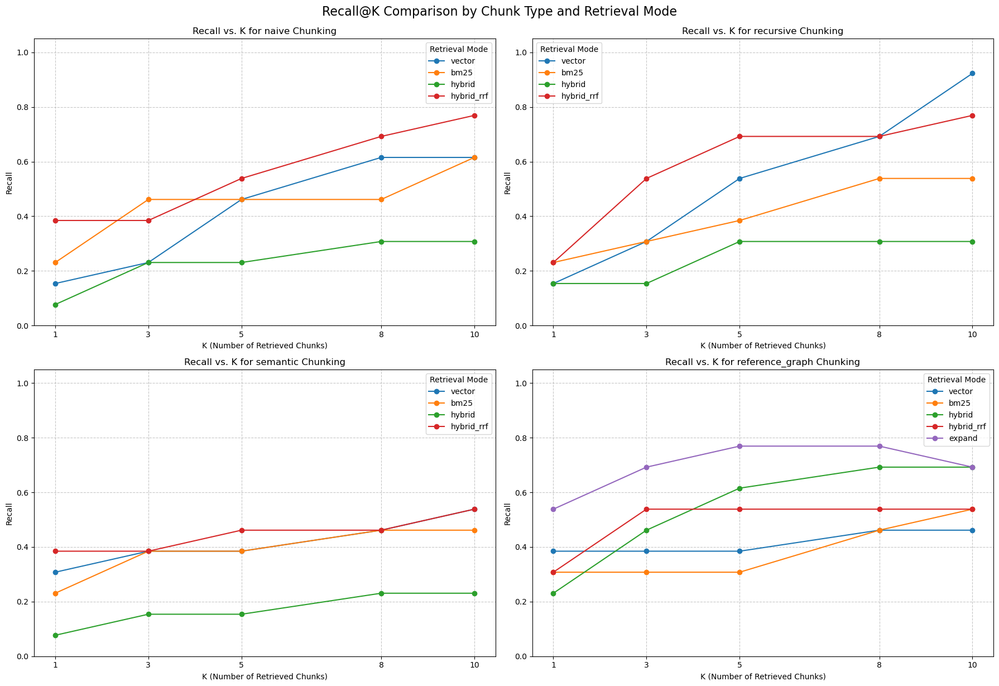


--- Generazione Grafici Numero Medio di Token Totali ---


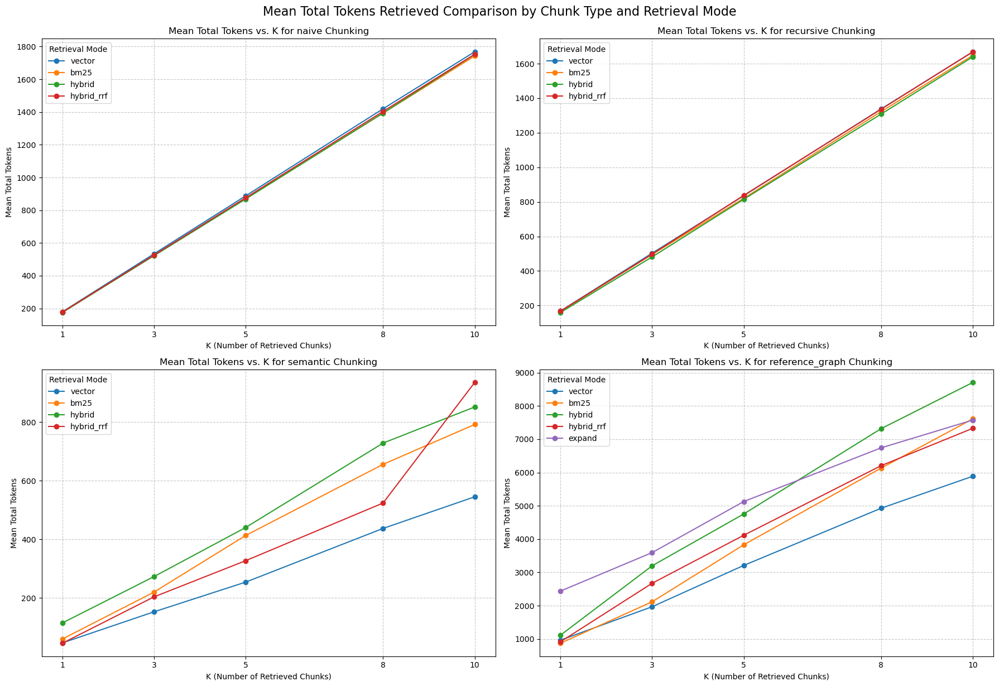


--- Generazione Grafici Combinati (Recall vs. Mean Total Tokens) ---


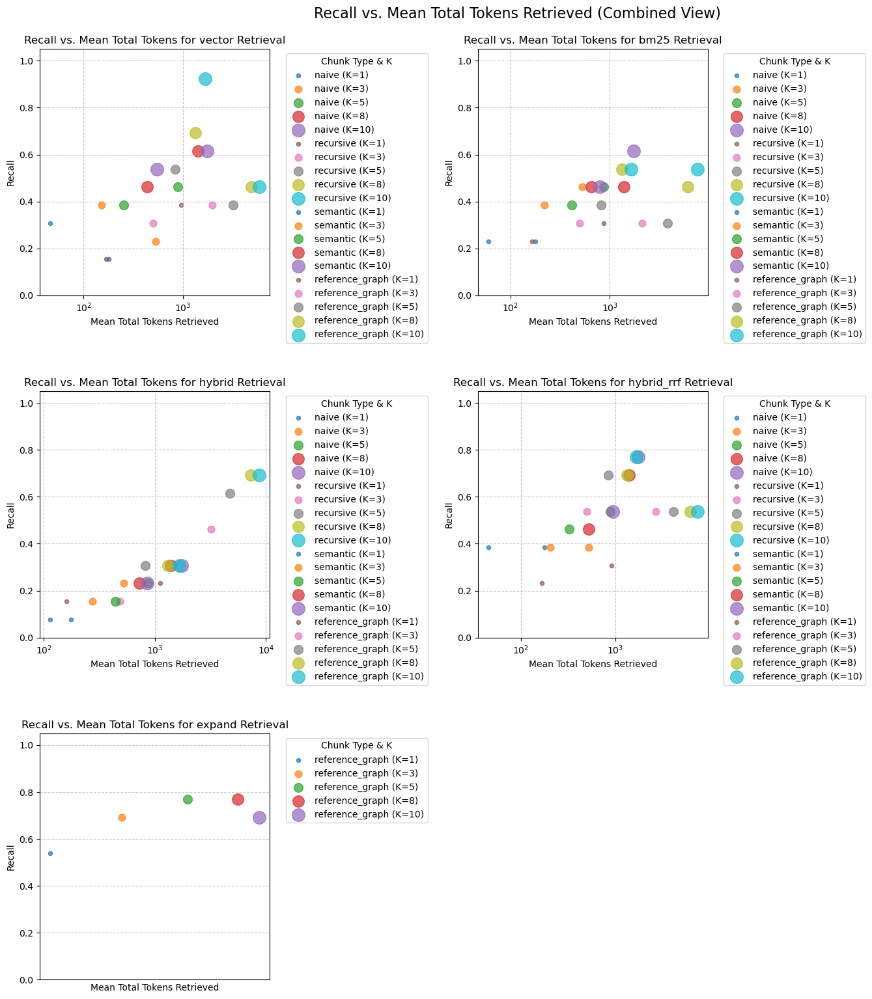


--- Generazione Grafici Tempo Medio di Retrieval ---


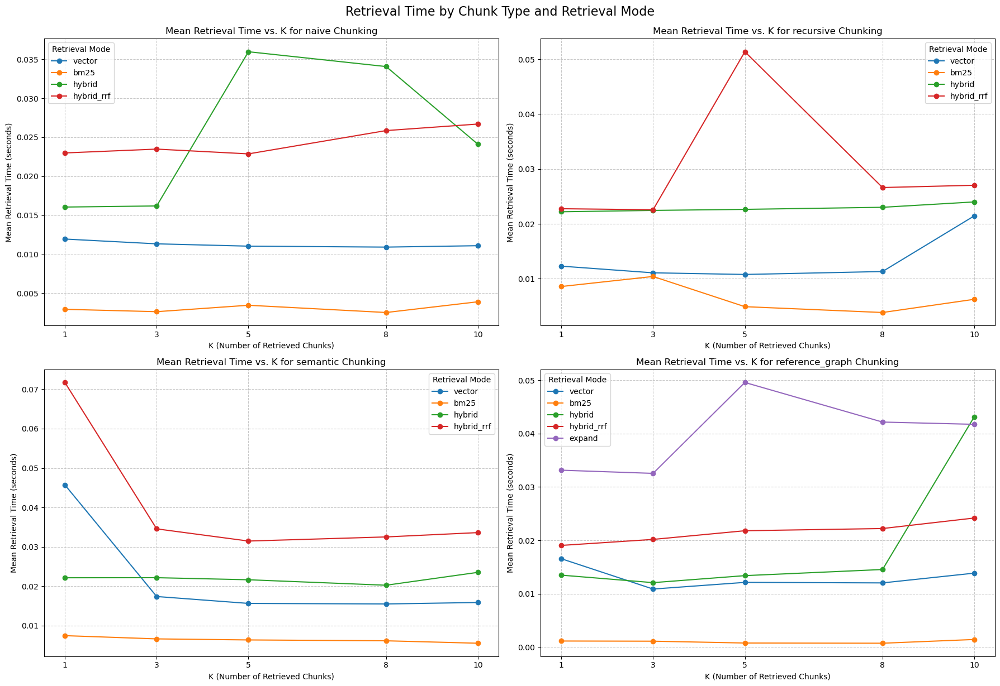

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assicurati che results_df sia il DataFrame che hai appena stampato e contiene i tuoi risultati

# --- Grafici per la Recall ---
print("\n--- Generazione Grafici Recall ---")
plt.figure(figsize=(18, 12)) # Dimensione generale per il plot

# Loop su ogni tipo di chunking per visualizzare le modalità di retrieval
chunk_types_unique = results_df["chunk_type"].unique()
modes_unique = results_df["mode"].unique()

for i, chunk_type in enumerate(chunk_types_unique):
    plt.subplot(2, 2, i + 1) # Crea una griglia di subplot (2x2 per 4 tipi di chunking)
    subset = results_df[results_df["chunk_type"] == chunk_type]

    for mode in modes_unique:
        mode_data = subset[subset["mode"] == mode]
        if not mode_data.empty: # Assicurati che ci siano dati per questa modalità
            plt.plot(mode_data["k"], mode_data["recall"], marker='o', label=mode)

    plt.title(f'Recall vs. K for {chunk_type} Chunking')
    plt.xlabel('K (Number of Retrieved Chunks)')
    plt.ylabel('Recall')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.xticks(Ks_to_evaluate) # Imposta i tick sull'asse x ai tuoi valori K
    plt.legend(title='Retrieval Mode')
    plt.ylim(0, 1.05) # Limite per la recall

plt.tight_layout()
plt.suptitle('Recall@K Comparison by Chunk Type and Retrieval Mode', y=1.02, fontsize=16) # Titolo generale
plt.show()


# --- Grafici per il Numero Medio di Token Totali ---
print("\n--- Generazione Grafici Numero Medio di Token Totali ---")
plt.figure(figsize=(18, 12)) # Dimensione generale per il plot

for i, chunk_type in enumerate(chunk_types_unique):
    plt.subplot(2, 2, i + 1) # Crea una griglia di subplot (2x2 per 4 tipi di chunking)
    subset = results_df[results_df["chunk_type"] == chunk_type]

    for mode in modes_unique:
        mode_data = subset[subset["mode"] == mode]
        if not mode_data.empty:
            plt.plot(mode_data["k"], mode_data["mean_total_tokens"], marker='o', label=mode)

    plt.title(f'Mean Total Tokens vs. K for {chunk_type} Chunking')
    plt.xlabel('K (Number of Retrieved Chunks)')
    plt.ylabel('Mean Total Tokens')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.xticks(Ks_to_evaluate) # Imposta i tick sull'asse x ai tuoi valori K
    plt.legend(title='Retrieval Mode')

plt.tight_layout()
plt.suptitle('Mean Total Tokens Retrieved Comparison by Chunk Type and Retrieval Mode', y=1.02, fontsize=16)
plt.show()

# --- Grafici Combinati (Recall vs. Mean Total Tokens) ---
# Questo tipo di grafico può essere più complesso da interpretare con molti K e modalità,
# ma può dare un'idea del trade-off.

import math

# Grafico combinato: Recall vs Mean Total Tokens per retrieval mode
print("\n--- Generazione Grafici Combinati (Recall vs. Mean Total Tokens) ---")

valid_modes = [mode for mode in modes_unique if not results_df[results_df['mode'] == mode].empty]
n_plots = len(valid_modes)
n_cols = 2
n_rows = math.ceil(n_plots / n_cols)

plt.figure(figsize=(n_cols * 8, n_rows * 5))

for i, mode in enumerate(valid_modes):
    plt.subplot(n_rows, n_cols, i + 1)
    subset_mode = results_df[results_df["mode"] == mode]

    for chunk_type in chunk_types_unique:
        chunk_data = subset_mode[subset_mode["chunk_type"] == chunk_type]
        if not chunk_data.empty:
            for k_val in Ks_to_evaluate:
                k_data = chunk_data[chunk_data["k"] == k_val]
                if not k_data.empty:
                    plt.scatter(k_data["mean_total_tokens"], k_data["recall"],
                                s=k_val*20,
                                label=f'{chunk_type} (K={k_val})',
                                alpha=0.7)

    plt.title(f'Recall vs. Mean Total Tokens for {mode} Retrieval')
    plt.xlabel('Mean Total Tokens Retrieved')
    plt.ylabel('Recall')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend(title='Chunk Type & K', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.ylim(0, 1.05)
    plt.xscale('log')
    plt.minorticks_off()

plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.suptitle('Recall vs. Mean Total Tokens Retrieved (Combined View)', y=1.02, fontsize=16)
plt.show()



# --- Grafici per il Tempo Medio di Retrieval ---
print("\n--- Generazione Grafici Tempo Medio di Retrieval ---")
plt.figure(figsize=(18, 12))  # Dimensione generale

for i, chunk_type in enumerate(chunk_types_unique):
    plt.subplot(2, 2, i + 1)
    subset = results_df[results_df["chunk_type"] == chunk_type]

    for mode in modes_unique:
        mode_data = subset[subset["mode"] == mode]
        if not mode_data.empty:
            plt.plot(mode_data["k"], mode_data["mean_retrieval_time"], marker='o', label=mode)

    plt.title(f'Mean Retrieval Time vs. K for {chunk_type} Chunking')
    plt.xlabel('K (Number of Retrieved Chunks)')
    plt.ylabel('Mean Retrieval Time (seconds)')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.xticks(Ks_to_evaluate)
    plt.legend(title='Retrieval Mode')

plt.tight_layout()
plt.suptitle('Retrieval Time by Chunk Type and Retrieval Mode', y=1.02, fontsize=16)
plt.show()


In [27]:
results_df["mode"].unique()

array(['vector', 'bm25', 'hybrid', 'hybrid_rrf', 'expand'], dtype=object)


--- Generazione Grafico Comparativo Recall vs. Mean Total Tokens con Limiti Contesto LLM ---


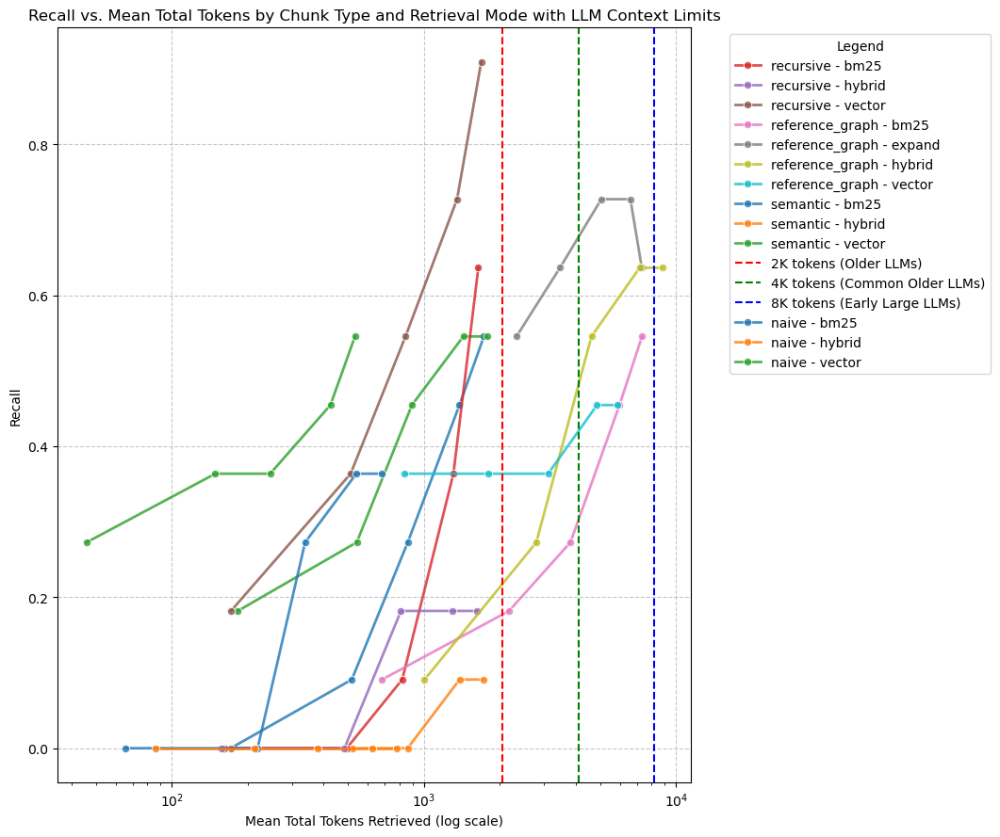

In [63]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Supponendo che 'results_df' sia già stato generato dal tuo codice precedente
# (DataFrame con colonne: chunk_type, mode, k, recall, avg_score_hit, mean_total_tokens)

print("\n--- Generazione Grafico Comparativo Recall vs. Mean Total Tokens con Limiti Contesto LLM ---")

plt.figure(figsize=(14, 9)) # Rende il grafico più grande per accogliere molti punti

# Assegna un colore e uno stile di linea/marker unico per ogni combinazione chunk_type e mode
# Creiamo una colonna combinata per la legenda
results_df['case'] = results_df['chunk_type'] + ' - ' + results_df['mode']

# Ordina il DataFrame per 'k' in modo che le linee siano disegnate correttamente
results_df_sorted = results_df.sort_values(by=['chunk_type', 'mode', 'k'])

# Usa Seaborn per un grafico più elegante e facile da raggruppare
sns.lineplot(
    data=results_df_sorted,
    x='mean_total_tokens',
    y='recall',
    hue='case',         # Colore basato sulla combinazione chunk_type - mode
    markers=True,       # Aggiunge marker per ogni punto dati (K)
    dashes=False,       # Non usare stili di linea tratteggiati per default
    marker='o',         # Tipo di marker
    palette='tab10',    # Palette di colori
    linewidth=2,
    alpha=0.8
)

# Aggiungi le linee verticali per i limiti di token degli LLM
llm_context_limits = [2048, 4096, 8192]
colors = ['red', 'green', 'blue'] # Colori per le linee verticali
labels = ['2K tokens (Older LLMs)', '4K tokens (Common Older LLMs)', '8K tokens (Early Large LLMs)']

for i, limit in enumerate(llm_context_limits):
    plt.axvline(x=limit, color=colors[i], linestyle='--', lw=1.5,
                label=labels[i])
    # Aggiungi un'annotazione testuale sopra la linea per maggiore chiarezza, se necessario
    # plt.text(limit, plt.ylim()[1]*0.9, f'{limit} tokens', rotation=90, va='top', ha='right', color=colors[i])


plt.title('Recall vs. Mean Total Tokens by Chunk Type and Retrieval Mode with LLM Context Limits')
plt.xlabel('Mean Total Tokens Retrieved (log scale)')
plt.ylabel('Recall')
plt.grid(True, linestyle='--', alpha=0.7)

# Usa scala logaritmica per l'asse X
plt.xscale('log')

# Aggiusta la legenda per essere esterna al grafico e includi le etichette delle linee verticali
handles, labels = plt.gca().get_legend_handles_labels()
# Separa le etichette dei casi dalle etichette delle linee verticali e riordina
case_handles = handles[len(llm_context_limits):]
case_labels = labels[len(llm_context_limits):]
llm_handles = handles[:len(llm_context_limits)]
llm_labels = labels[:len(llm_context_limits)]

# Crea una nuova leggenda che includa sia i casi che i limiti LLM
plt.legend(case_handles + llm_handles, case_labels + llm_labels,
           title='Legend', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout(rect=[0, 0, 0.78, 1]) # Regola il layout per fare spazio alla legenda

plt.show()

# A_Robust_Governance_for_the_AI_Act - Retrieve & Evaluation

In [94]:
import import_ipynb
import importlib

import evaluation_utils
importlib.reload(evaluation_utils)
from evaluation_utils import * 

import retrieval_utils
importlib.reload(retrieval_utils)
from retrieval_utils import *

import os
import pandas as pd
import numpy as np
from evaluation_utils import get_match_across_subspans
from retrieval_utils import RetrievalSystem

# 1) Definiamo i path alle sottocartelle di indexes
document_folder = "A_Robust_Governance_for_the_AI_Act"

base_indexes = f"../data/indexes/{document_folder}"
chunk_types = {
    "naive": {
        "index_path": os.path.join(base_indexes, f"{document_folder}_naive_chunks", "faiss_index_all-MiniLM-L6-v2.faiss"),
        "meta_path":  os.path.join(base_indexes, f"{document_folder}_naive_chunks", "chunks_meta_all-MiniLM-L6-v2.pkl"),
        "vecs_path":  os.path.join(base_indexes, f"{document_folder}_naive_chunks", "chunk_vecs_all-MiniLM-L6-v2.pkl"),
        "graph_path": None
    },
    "recursive": {
        "index_path": os.path.join(base_indexes, f"{document_folder}_recursive_chunks", "faiss_index_all-MiniLM-L6-v2.faiss"),
        "meta_path":  os.path.join(base_indexes, f"{document_folder}_recursive_chunks", "chunks_meta_all-MiniLM-L6-v2.pkl"),
        "vecs_path":  os.path.join(base_indexes, f"{document_folder}_recursive_chunks", "chunk_vecs_all-MiniLM-L6-v2.pkl"),
        "graph_path": None
    },
    "semantic": {
        "index_path": os.path.join(base_indexes, f"{document_folder}_semantic_chunks", "faiss_index_all-MiniLM-L6-v2.faiss"),
        "meta_path":  os.path.join(base_indexes, f"{document_folder}_semantic_chunks", "chunks_meta_all-MiniLM-L6-v2.pkl"),
        "vecs_path":  os.path.join(base_indexes, f"{document_folder}_semantic_chunks", "chunk_vecs_all-MiniLM-L6-v2.pkl"),
        "graph_path": None
    }
}

print(chunk_types)

{'naive': {'index_path': '../data/indexes/A_Robust_Governance_for_the_AI_Act\\A_Robust_Governance_for_the_AI_Act_naive_chunks\\faiss_index_all-MiniLM-L6-v2.faiss', 'meta_path': '../data/indexes/A_Robust_Governance_for_the_AI_Act\\A_Robust_Governance_for_the_AI_Act_naive_chunks\\chunks_meta_all-MiniLM-L6-v2.pkl', 'vecs_path': '../data/indexes/A_Robust_Governance_for_the_AI_Act\\A_Robust_Governance_for_the_AI_Act_naive_chunks\\chunk_vecs_all-MiniLM-L6-v2.pkl', 'graph_path': None}, 'recursive': {'index_path': '../data/indexes/A_Robust_Governance_for_the_AI_Act\\A_Robust_Governance_for_the_AI_Act_recursive_chunks\\faiss_index_all-MiniLM-L6-v2.faiss', 'meta_path': '../data/indexes/A_Robust_Governance_for_the_AI_Act\\A_Robust_Governance_for_the_AI_Act_recursive_chunks\\chunks_meta_all-MiniLM-L6-v2.pkl', 'vecs_path': '../data/indexes/A_Robust_Governance_for_the_AI_Act\\A_Robust_Governance_for_the_AI_Act_recursive_chunks\\chunk_vecs_all-MiniLM-L6-v2.pkl', 'graph_path': None}, 'semantic': {'ind

In [96]:
import evaluation_utils
importlib.reload(evaluation_utils)
from evaluation_utils import *

import retrieval_utils
importlib.reload(retrieval_utils)
from retrieval_utils import *

import os
import pandas as pd
import numpy as np
from evaluation_utils import get_match_across_subspans
from retrieval_utils import RetrievalSystem
import json
import nltk
from nltk.tokenize import word_tokenize


# 2) Carica il QA benchmark
with open("../data/benchmarks/qa_benchmark.json", "r", encoding="utf-8") as f:
    data = json.load(f)
qa_df = pd.DataFrame(data)
ai_act_qa_df = qa_df[qa_df["main_document"] == "A_robust_governance_for_the_AI_Act"].reset_index(drop=True)

# Definisci i percorsi per i chunk_types (Assicurati che questi siano definiti nel tuo ambi
document_folder = "A_Robust_Governance_for_the_AI_Act"

base_indexes = f"../data/indexes/{document_folder}"
chunk_types = {
    "naive": {
        "index_path": os.path.join(base_indexes, f"{document_folder}_naive_chunks", "faiss_index_all-MiniLM-L6-v2.faiss"),
        "meta_path":  os.path.join(base_indexes, f"{document_folder}_naive_chunks", "chunks_meta_all-MiniLM-L6-v2.pkl"),
        "vecs_path":  os.path.join(base_indexes, f"{document_folder}_naive_chunks", "chunk_vecs_all-MiniLM-L6-v2.pkl"),
        "graph_path": None
    },
    "recursive": {
        "index_path": os.path.join(base_indexes, f"{document_folder}_recursive_chunks", "faiss_index_all-MiniLM-L6-v2.faiss"),
        "meta_path":  os.path.join(base_indexes, f"{document_folder}_recursive_chunks", "chunks_meta_all-MiniLM-L6-v2.pkl"),
        "vecs_path":  os.path.join(base_indexes, f"{document_folder}_recursive_chunks", "chunk_vecs_all-MiniLM-L6-v2.pkl"),
        "graph_path": None
    },
    "semantic": {
        "index_path": os.path.join(base_indexes, f"{document_folder}_semantic_chunks", "faiss_index_all-MiniLM-L6-v2.faiss"),
        "meta_path":  os.path.join(base_indexes, f"{document_folder}_semantic_chunks", "chunks_meta_all-MiniLM-L6-v2.pkl"),
        "vecs_path":  os.path.join(base_indexes, f"{document_folder}_semantic_chunks", "chunk_vecs_all-MiniLM-L6-v2.pkl"),
        "graph_path": None
    }
}


def count_tokens(text):
    """Conta il numero di token usando nltk.word_tokenize."""
    return len(word_tokenize(text))

# 3) Funzione di evaluation per un singolo RetrievalSystem e modalità, con K variabile e conteggio token
import time  # <-- aggiungi all'inizio se non l'hai ancora fatto

def evaluate_method_on_qa_extended(rsys, qa_df, mode: str, ks: list = [1, 3, 5, 10]):
    results_by_k = {}
    for k_val in ks:
        total = len(qa_df)
        hits = 0
        scores_matched = []
        avg_tokens_per_query = []
        retrieval_times = []

        for _, row in ai_act_qa_df.iterrows():
            q = row["question"]
            gold_spans = row["answer_span"]  # lista di sub-span

            # ⏱️ Inizio tempo
            start = time.time()

            # 1) recupero top-K
            if mode == "vector":
                results = rsys.retrieve_vector(q, k=k_val)
            elif mode == "bm25":
                results = rsys.retrieve_bm25(q, k=k_val)
            elif mode == "hybrid":
                results = rsys.retrieve_hybrid(q, k=k_val)
            elif mode == "hybrid_rrf":
                results = rsys.retrieve_hybrid_rrf(q, k=k_val)
            elif mode == "expand":
                results = rsys.retrieve_and_expand(q, top_k=k_val, max_ref=2, mode="vector")
            else:
                raise ValueError(f"Mode sconosciuto: {mode}")

            # ⏱️ Fine tempo
            elapsed = time.time() - start
            retrieval_times.append(elapsed)

            # Token count
            current_query_tokens = sum(count_tokens(chunk["text"]) for chunk in results)
            if results:
                avg_tokens_per_query.append(current_query_tokens)

            # Matching
            matched = get_match_across_subspans(gold_spans, results)
            if matched:
                hits += 1
                match_scores = []
                for chunk in results:
                    for sub in gold_spans:
                        if sub in chunk["text"] or sub.lower() in chunk["text"].lower():
                            if chunk.get("score") is not None:
                                match_scores.append(chunk["score"])
                            break
                if match_scores:
                    scores_matched.append(np.mean(match_scores))

        recall = hits / total
        avg_score_hit = np.mean(scores_matched) if scores_matched else None
        mean_total_tokens = np.mean(avg_tokens_per_query) if avg_tokens_per_query else 0
        mean_retrieval_time = np.mean(retrieval_times) if retrieval_times else 0

        results_by_k[k_val] = {
            "recall": recall,
            "avg_score_hit": avg_score_hit,
            "mean_total_tokens": mean_total_tokens,
            "mean_retrieval_time": mean_retrieval_time
        }
    return results_by_k


# 4) Loop sui tipi di chunk e modalità di retrieval
Ks_to_evaluate = [1, 3, 5, 8, 10] # Definisci i K che vuoi testare
rows = []
print(chunk_types)
for chunk_type, paths in chunk_types.items():
    print(f"\n>>> Evaluating chunk type: {chunk_type}")
    print(paths)
    # Istanzia RetrievalSystem con i path corretti
    rsys = RetrievalSystem(
        faiss_index_path=paths["index_path"],
        meta_path=paths["meta_path"],
        vecs_path=paths["vecs_path"],
        graph_path=paths["graph_path"],
        embedding_model_name="all-MiniLM-L6-v2"
    )
    # Definiamo le modalità da testare: vector, bm25, hybrid; aggiungiamo 'expand' solo se reference_graph
    modes = ["vector", "bm25", "hybrid", "hybrid_rrf"]
    if chunk_type == "reference_graph":
        modes.append("expand")
    
    for mode in modes:
        print(f"- modalità {mode} ...")
        # Chiama la funzione estesa che valuta per diversi K
        res_per_k = evaluate_method_on_qa_extended(rsys, ai_act_qa_df, mode=mode, ks=Ks_to_evaluate)
        
        for k_val, res in res_per_k.items():
            rows.append({
                "chunk_type": chunk_type,
                "mode": mode,
                "k": k_val,
                "recall": res["recall"],
                "avg_score_hit": res["avg_score_hit"],
                "mean_total_tokens": res["mean_total_tokens"],
                "mean_retrieval_time": res["mean_retrieval_time"]
            })


# 5) Costruisci DataFrame riepilogo e pivot per recall e token medi
results_df = pd.DataFrame(rows)

print("\n--- Risultati Dettagliati ---")
print(results_df)

# Pivot per la Recall@K in funzione di K
print("\nRecall@K table (chunk_type vs mode, per ogni K):")
for k_val in Ks_to_evaluate:
    pivot_recall_k = results_df[results_df["k"] == k_val].pivot(
        index="chunk_type", columns="mode", values="recall"
    )
    print(f"\nK = {k_val}:")
    print(pivot_recall_k)

# Pivot per il Numero Medio di Token per Estrazione
print("\nMean Total Tokens per Extraction table (chunk_type vs mode, per ogni K):")
for k_val in Ks_to_evaluate:
    pivot_tokens_k = results_df[results_df["k"] == k_val].pivot(
        index="chunk_type", columns="mode", values="mean_total_tokens"
    )
    print(f"\nK = {k_val}:")
    print(pivot_tokens_k)

# Se vuoi ancora l'Avg matched-score pivot table:
print("\nAvg matched-score pivot table (chunk_type vs mode, per ogni K):")
for k_val in Ks_to_evaluate:
    pivot_score_k = results_df[results_df["k"] == k_val].pivot(
        index="chunk_type", columns="mode", values="avg_score_hit"
    )
    print(f"\nK = {k_val}:")
    print(pivot_score_k)


# Pivot per tempo medio di retrieval
print("\nMean Retrieval Time per Query (seconds):")
for k_val in Ks_to_evaluate:
    pivot_time_k = results_df[results_df["k"] == k_val].pivot(
        index="chunk_type", columns="mode", values="mean_retrieval_time"
    )
    print(f"\nK = {k_val}:")
    print(pivot_time_k.round(3))


{'naive': {'index_path': '../data/indexes/A_Robust_Governance_for_the_AI_Act\\A_Robust_Governance_for_the_AI_Act_naive_chunks\\faiss_index_all-MiniLM-L6-v2.faiss', 'meta_path': '../data/indexes/A_Robust_Governance_for_the_AI_Act\\A_Robust_Governance_for_the_AI_Act_naive_chunks\\chunks_meta_all-MiniLM-L6-v2.pkl', 'vecs_path': '../data/indexes/A_Robust_Governance_for_the_AI_Act\\A_Robust_Governance_for_the_AI_Act_naive_chunks\\chunk_vecs_all-MiniLM-L6-v2.pkl', 'graph_path': None}, 'recursive': {'index_path': '../data/indexes/A_Robust_Governance_for_the_AI_Act\\A_Robust_Governance_for_the_AI_Act_recursive_chunks\\faiss_index_all-MiniLM-L6-v2.faiss', 'meta_path': '../data/indexes/A_Robust_Governance_for_the_AI_Act\\A_Robust_Governance_for_the_AI_Act_recursive_chunks\\chunks_meta_all-MiniLM-L6-v2.pkl', 'vecs_path': '../data/indexes/A_Robust_Governance_for_the_AI_Act\\A_Robust_Governance_for_the_AI_Act_recursive_chunks\\chunk_vecs_all-MiniLM-L6-v2.pkl', 'graph_path': None}, 'semantic': {'ind


--- Generazione Grafici Recall ---


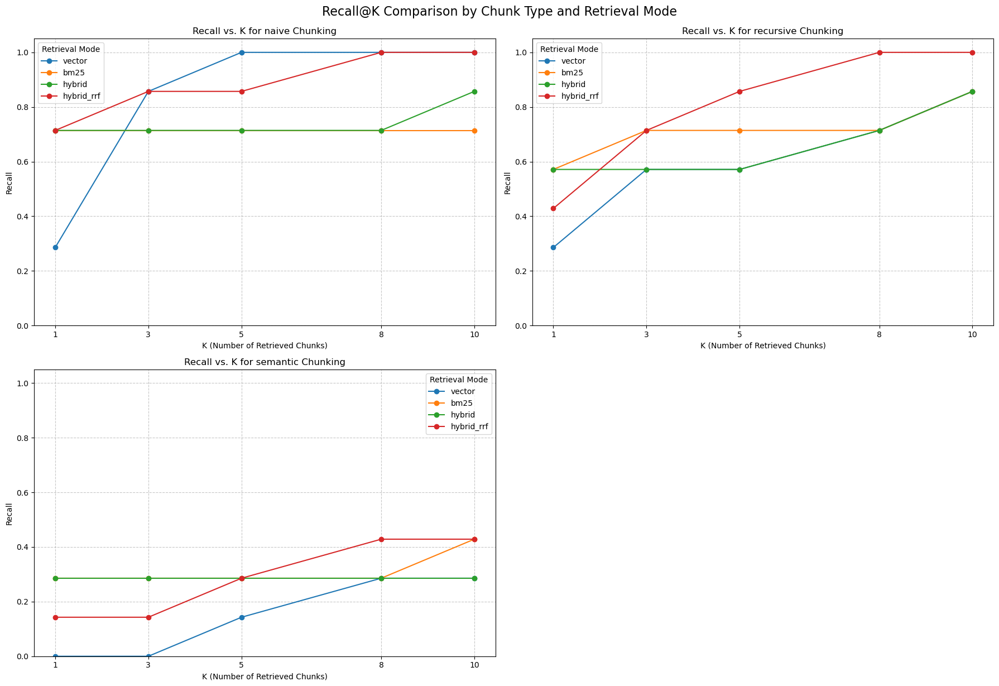


--- Generazione Grafici Numero Medio di Token Totali ---


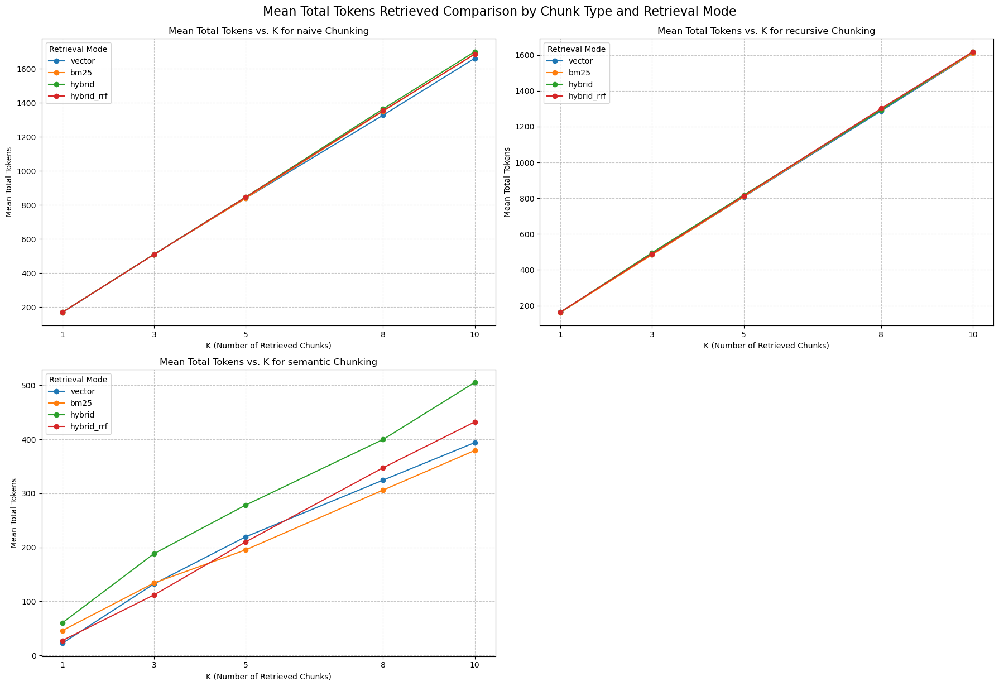


--- Generazione Grafici Combinati (Recall vs. Mean Total Tokens) ---


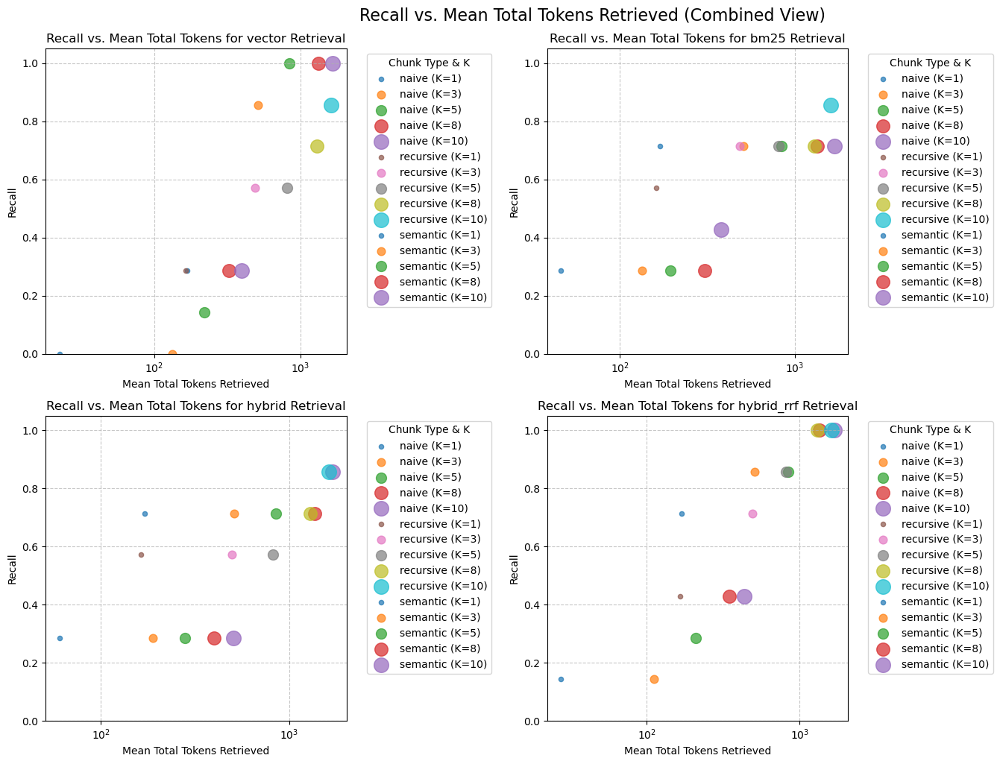


--- Generazione Grafici Tempo Medio di Retrieval ---


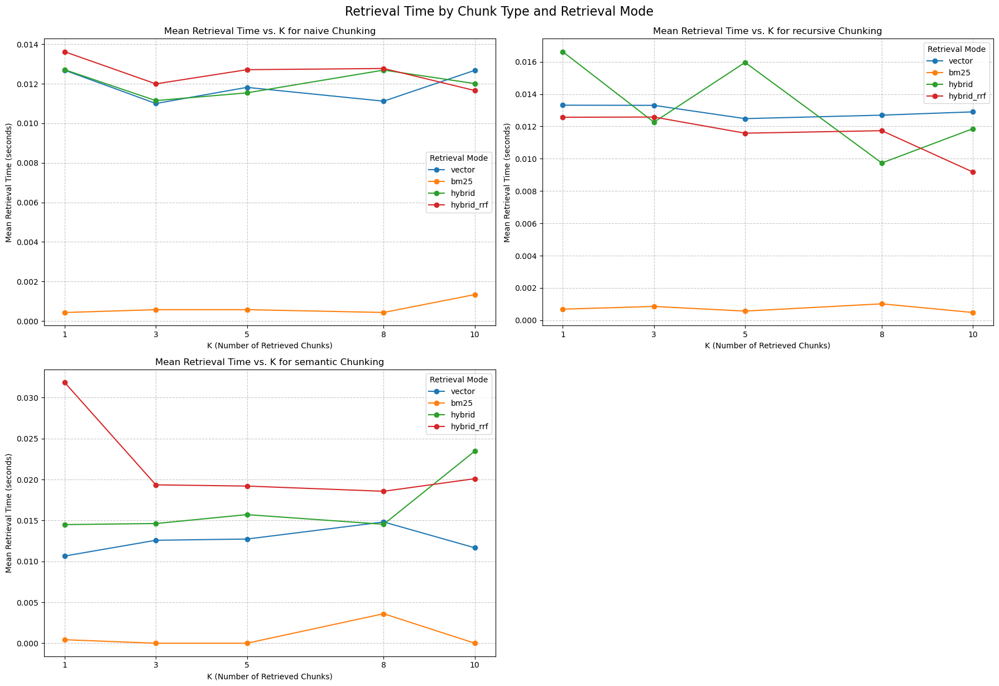

In [97]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assicurati che results_df sia il DataFrame che hai appena stampato e contiene i tuoi risultati

# --- Grafici per la Recall ---
print("\n--- Generazione Grafici Recall ---")
plt.figure(figsize=(18, 12)) # Dimensione generale per il plot

# Loop su ogni tipo di chunking per visualizzare le modalità di retrieval
chunk_types_unique = results_df["chunk_type"].unique()
modes_unique = results_df["mode"].unique()

for i, chunk_type in enumerate(chunk_types_unique):
    plt.subplot(2, 2, i + 1) # Crea una griglia di subplot (2x2 per 4 tipi di chunking)
    subset = results_df[results_df["chunk_type"] == chunk_type]

    for mode in modes_unique:
        mode_data = subset[subset["mode"] == mode]
        if not mode_data.empty: # Assicurati che ci siano dati per questa modalità
            plt.plot(mode_data["k"], mode_data["recall"], marker='o', label=mode)

    plt.title(f'Recall vs. K for {chunk_type} Chunking')
    plt.xlabel('K (Number of Retrieved Chunks)')
    plt.ylabel('Recall')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.xticks(Ks_to_evaluate) # Imposta i tick sull'asse x ai tuoi valori K
    plt.legend(title='Retrieval Mode')
    plt.ylim(0, 1.05) # Limite per la recall

plt.tight_layout()
plt.suptitle('Recall@K Comparison by Chunk Type and Retrieval Mode', y=1.02, fontsize=16) # Titolo generale
plt.show()


# --- Grafici per il Numero Medio di Token Totali ---
print("\n--- Generazione Grafici Numero Medio di Token Totali ---")
plt.figure(figsize=(18, 12)) # Dimensione generale per il plot

for i, chunk_type in enumerate(chunk_types_unique):
    plt.subplot(2, 2, i + 1) # Crea una griglia di subplot (2x2 per 4 tipi di chunking)
    subset = results_df[results_df["chunk_type"] == chunk_type]

    for mode in modes_unique:
        mode_data = subset[subset["mode"] == mode]
        if not mode_data.empty:
            plt.plot(mode_data["k"], mode_data["mean_total_tokens"], marker='o', label=mode)

    plt.title(f'Mean Total Tokens vs. K for {chunk_type} Chunking')
    plt.xlabel('K (Number of Retrieved Chunks)')
    plt.ylabel('Mean Total Tokens')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.xticks(Ks_to_evaluate) # Imposta i tick sull'asse x ai tuoi valori K
    plt.legend(title='Retrieval Mode')

plt.tight_layout()
plt.suptitle('Mean Total Tokens Retrieved Comparison by Chunk Type and Retrieval Mode', y=1.02, fontsize=16)
plt.show()

# --- Grafici Combinati (Recall vs. Mean Total Tokens) ---
# Questo tipo di grafico può essere più complesso da interpretare con molti K e modalità,
# ma può dare un'idea del trade-off.

import math

# Grafico combinato: Recall vs Mean Total Tokens per retrieval mode
print("\n--- Generazione Grafici Combinati (Recall vs. Mean Total Tokens) ---")

valid_modes = [mode for mode in modes_unique if not results_df[results_df['mode'] == mode].empty]
n_plots = len(valid_modes)
n_cols = 2
n_rows = math.ceil(n_plots / n_cols)

plt.figure(figsize=(n_cols * 8, n_rows * 5))

for i, mode in enumerate(valid_modes):
    plt.subplot(n_rows, n_cols, i + 1)
    subset_mode = results_df[results_df["mode"] == mode]

    for chunk_type in chunk_types_unique:
        chunk_data = subset_mode[subset_mode["chunk_type"] == chunk_type]
        if not chunk_data.empty:
            for k_val in Ks_to_evaluate:
                k_data = chunk_data[chunk_data["k"] == k_val]
                if not k_data.empty:
                    plt.scatter(k_data["mean_total_tokens"], k_data["recall"],
                                s=k_val*20,
                                label=f'{chunk_type} (K={k_val})',
                                alpha=0.7)

    plt.title(f'Recall vs. Mean Total Tokens for {mode} Retrieval')
    plt.xlabel('Mean Total Tokens Retrieved')
    plt.ylabel('Recall')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend(title='Chunk Type & K', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.ylim(0, 1.05)
    plt.xscale('log')
    plt.minorticks_off()

plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.suptitle('Recall vs. Mean Total Tokens Retrieved (Combined View)', y=1.02, fontsize=16)
plt.show()



# --- Grafici per il Tempo Medio di Retrieval ---
print("\n--- Generazione Grafici Tempo Medio di Retrieval ---")
plt.figure(figsize=(18, 12))  # Dimensione generale

for i, chunk_type in enumerate(chunk_types_unique):
    plt.subplot(2, 2, i + 1)
    subset = results_df[results_df["chunk_type"] == chunk_type]

    for mode in modes_unique:
        mode_data = subset[subset["mode"] == mode]
        if not mode_data.empty:
            plt.plot(mode_data["k"], mode_data["mean_retrieval_time"], marker='o', label=mode)

    plt.title(f'Mean Retrieval Time vs. K for {chunk_type} Chunking')
    plt.xlabel('K (Number of Retrieved Chunks)')
    plt.ylabel('Mean Retrieval Time (seconds)')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.xticks(Ks_to_evaluate)
    plt.legend(title='Retrieval Mode')

plt.tight_layout()
plt.suptitle('Retrieval Time by Chunk Type and Retrieval Mode', y=1.02, fontsize=16)
plt.show()


# GDPR - Retrieval Evaluation

In [98]:
import importlib

import evaluation_utils
importlib.reload(evaluation_utils)
from evaluation_utils import *

import retrieval_utils
importlib.reload(retrieval_utils)
from retrieval_utils import *

import os
import pandas as pd
import numpy as np
from evaluation_utils import get_match_across_subspans
from retrieval_utils import RetrievalSystem
import json
import nltk
from nltk.tokenize import word_tokenize


# 2) Carica il QA benchmark
with open("../data/benchmarks/qa_benchmark.json", "r", encoding="utf-8") as f:
    data = json.load(f)
qa_df = pd.DataFrame(data)
ai_act_qa_df = qa_df[qa_df["main_document"] == "GDPR"].reset_index(drop=True)

print("Number of benchmark: ", ai_act_qa_df.shape)
# Definisci i percorsi per i chunk_types (Assicurati che questi siano definiti nel tuo ambi
document_folder = "GDPR"

base_indexes = f"../data/indexes/{document_folder}"
chunk_types = {
    "naive": {
        "index_path": os.path.join(base_indexes, f"{document_folder}_naive_chunks", "faiss_index_all-MiniLM-L6-v2.faiss"),
        "meta_path":  os.path.join(base_indexes, f"{document_folder}_naive_chunks", "chunks_meta_all-MiniLM-L6-v2.pkl"),
        "vecs_path":  os.path.join(base_indexes, f"{document_folder}_naive_chunks", "chunk_vecs_all-MiniLM-L6-v2.pkl"),
        "graph_path": None
    },
    "recursive": {
        "index_path": os.path.join(base_indexes, f"{document_folder}_recursive_chunks", "faiss_index_all-MiniLM-L6-v2.faiss"),
        "meta_path":  os.path.join(base_indexes, f"{document_folder}_recursive_chunks", "chunks_meta_all-MiniLM-L6-v2.pkl"),
        "vecs_path":  os.path.join(base_indexes, f"{document_folder}_recursive_chunks", "chunk_vecs_all-MiniLM-L6-v2.pkl"),
        "graph_path": None
    },
    "semantic": {
        "index_path": os.path.join(base_indexes, f"{document_folder}_semantic_chunks", "faiss_index_all-MiniLM-L6-v2.faiss"),
        "meta_path":  os.path.join(base_indexes, f"{document_folder}_semantic_chunks", "chunks_meta_all-MiniLM-L6-v2.pkl"),
        "vecs_path":  os.path.join(base_indexes, f"{document_folder}_semantic_chunks", "chunk_vecs_all-MiniLM-L6-v2.pkl"),
        "graph_path": None
    }
}


def count_tokens(text):
    """Conta il numero di token usando nltk.word_tokenize."""
    return len(word_tokenize(text))


# 3) Funzione di evaluation per un singolo RetrievalSystem e modalità, con K variabile e conteggio token
import time  # <-- aggiungi all'inizio se non l'hai ancora fatto
# 4) Loop sui tipi di chunk e modalità di retrieval
Ks_to_evaluate = [1, 3, 5, 8, 10] # Definisci i K che vuoi testare
rows = []
print(chunk_types)
for chunk_type, paths in chunk_types.items():
    print(f"\n>>> Evaluating chunk type: {chunk_type}")
    print(paths)
    # Istanzia RetrievalSystem con i path corretti
    rsys = RetrievalSystem(
        faiss_index_path=paths["index_path"],
        meta_path=paths["meta_path"],
        vecs_path=paths["vecs_path"],
        graph_path=paths["graph_path"],
        embedding_model_name="all-MiniLM-L6-v2"
    )
    # Definiamo le modalità da testare: vector, bm25, hybrid; aggiungiamo 'expand' solo se reference_graph
    modes = ["vector", "bm25", "hybrid", "hybrid_rrf"]
    if chunk_type == "reference_graph":
        modes.append("expand")
    
    for mode in modes:
        print(f"- modalità {mode} ...")
        # Chiama la funzione estesa che valuta per diversi K
        res_per_k = evaluate_method_on_qa_extended(rsys, ai_act_qa_df, mode=mode, ks=Ks_to_evaluate)
        
        for k_val, res in res_per_k.items():
            rows.append({
                "chunk_type": chunk_type,
                "mode": mode,
                "k": k_val,
                "recall": res["recall"],
                "avg_score_hit": res["avg_score_hit"],
                "mean_total_tokens": res["mean_total_tokens"],
                "mean_retrieval_time": res["mean_retrieval_time"]
            })


# 5) Costruisci DataFrame riepilogo e pivot per recall e token medi
results_df = pd.DataFrame(rows)

print("\n--- Risultati Dettagliati ---")
print(results_df)

# Pivot per la Recall@K in funzione di K
print("\nRecall@K table (chunk_type vs mode, per ogni K):")
for k_val in Ks_to_evaluate:
    pivot_recall_k = results_df[results_df["k"] == k_val].pivot(
        index="chunk_type", columns="mode", values="recall"
    )
    print(f"\nK = {k_val}:")
    print(pivot_recall_k)

# Pivot per il Numero Medio di Token per Estrazione
print("\nMean Total Tokens per Extraction table (chunk_type vs mode, per ogni K):")
for k_val in Ks_to_evaluate:
    pivot_tokens_k = results_df[results_df["k"] == k_val].pivot(
        index="chunk_type", columns="mode", values="mean_total_tokens"
    )
    print(f"\nK = {k_val}:")
    print(pivot_tokens_k)

# Se vuoi ancora l'Avg matched-score pivot table:
print("\nAvg matched-score pivot table (chunk_type vs mode, per ogni K):")
for k_val in Ks_to_evaluate:
    pivot_score_k = results_df[results_df["k"] == k_val].pivot(
        index="chunk_type", columns="mode", values="avg_score_hit"
    )
    print(f"\nK = {k_val}:")
    print(pivot_score_k)


# Pivot per tempo medio di retrieval
print("\nMean Retrieval Time per Query (seconds):")
for k_val in Ks_to_evaluate:
    pivot_time_k = results_df[results_df["k"] == k_val].pivot(
        index="chunk_type", columns="mode", values="mean_retrieval_time"
    )
    print(f"\nK = {k_val}:")
    print(pivot_time_k.round(3))


Number of benchmark:  (6, 8)
{'naive': {'index_path': '../data/indexes/GDPR\\GDPR_naive_chunks\\faiss_index_all-MiniLM-L6-v2.faiss', 'meta_path': '../data/indexes/GDPR\\GDPR_naive_chunks\\chunks_meta_all-MiniLM-L6-v2.pkl', 'vecs_path': '../data/indexes/GDPR\\GDPR_naive_chunks\\chunk_vecs_all-MiniLM-L6-v2.pkl', 'graph_path': None}, 'recursive': {'index_path': '../data/indexes/GDPR\\GDPR_recursive_chunks\\faiss_index_all-MiniLM-L6-v2.faiss', 'meta_path': '../data/indexes/GDPR\\GDPR_recursive_chunks\\chunks_meta_all-MiniLM-L6-v2.pkl', 'vecs_path': '../data/indexes/GDPR\\GDPR_recursive_chunks\\chunk_vecs_all-MiniLM-L6-v2.pkl', 'graph_path': None}, 'semantic': {'index_path': '../data/indexes/GDPR\\GDPR_semantic_chunks\\faiss_index_all-MiniLM-L6-v2.faiss', 'meta_path': '../data/indexes/GDPR\\GDPR_semantic_chunks\\chunks_meta_all-MiniLM-L6-v2.pkl', 'vecs_path': '../data/indexes/GDPR\\GDPR_semantic_chunks\\chunk_vecs_all-MiniLM-L6-v2.pkl', 'graph_path': None}}

>>> Evaluating chunk type: naive


--- Generazione Grafici Recall ---


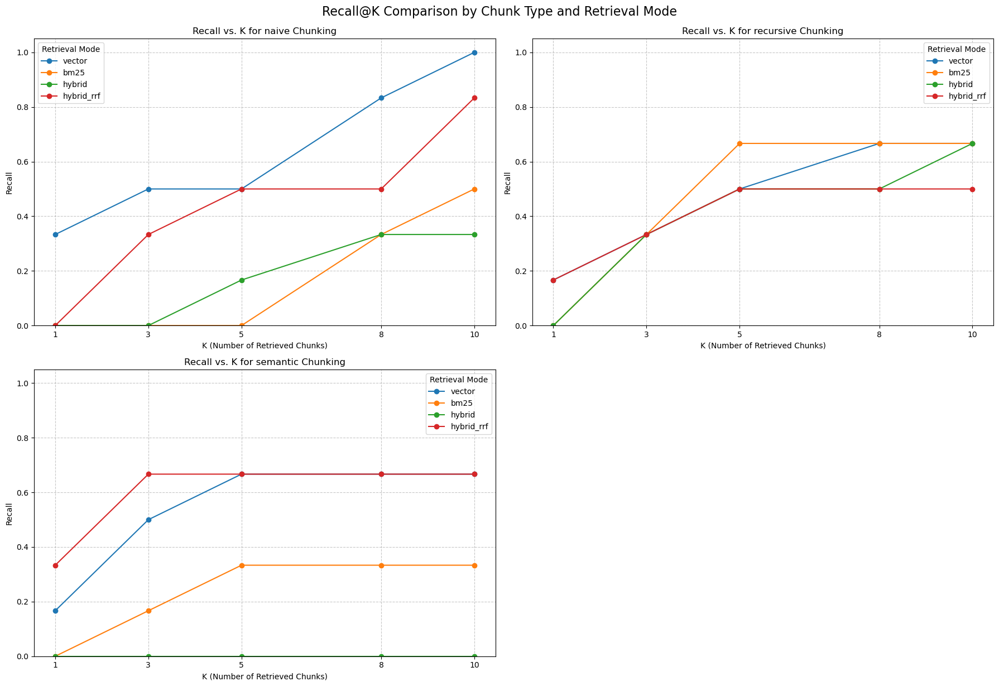


--- Generazione Grafici Numero Medio di Token Totali ---


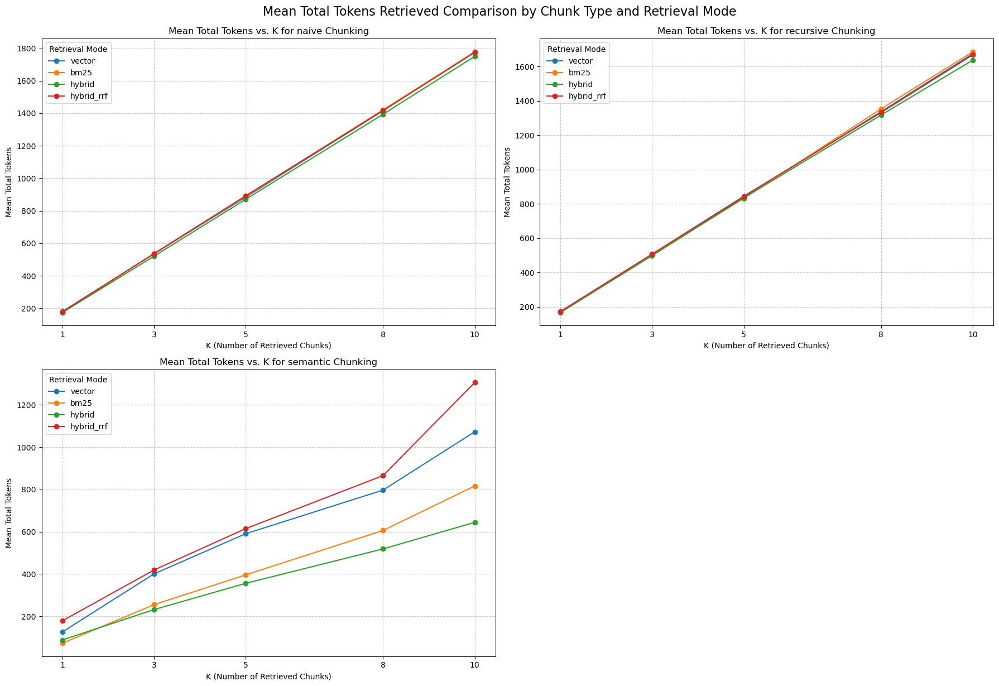


--- Generazione Grafici Combinati (Recall vs. Mean Total Tokens) ---


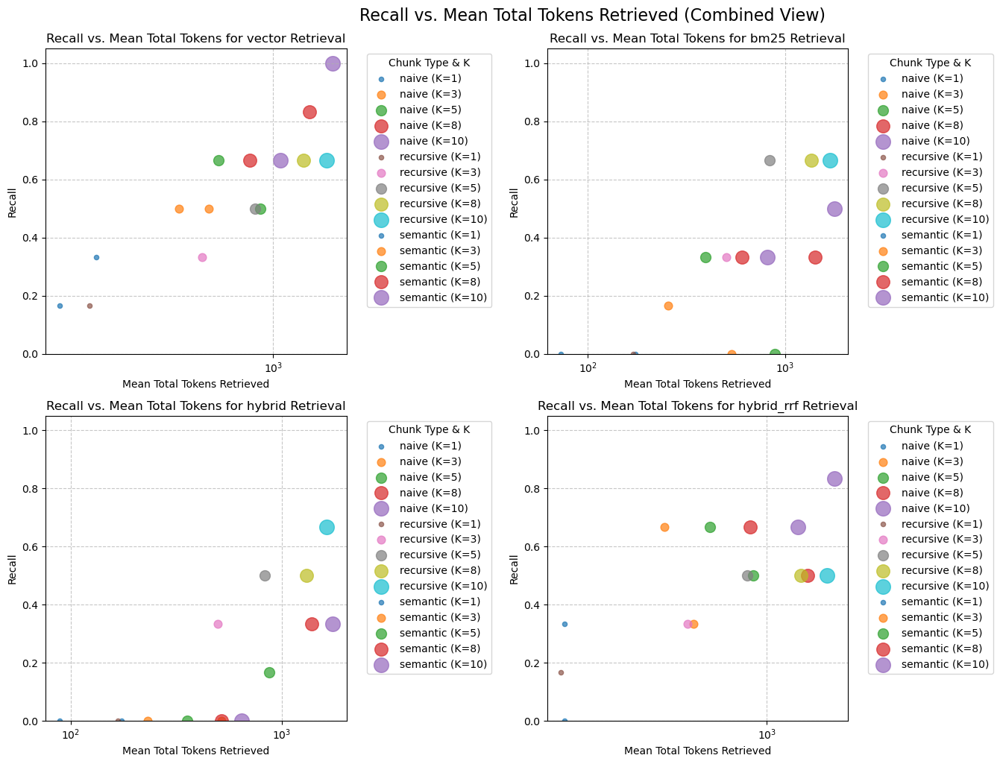


--- Generazione Grafici Tempo Medio di Retrieval ---


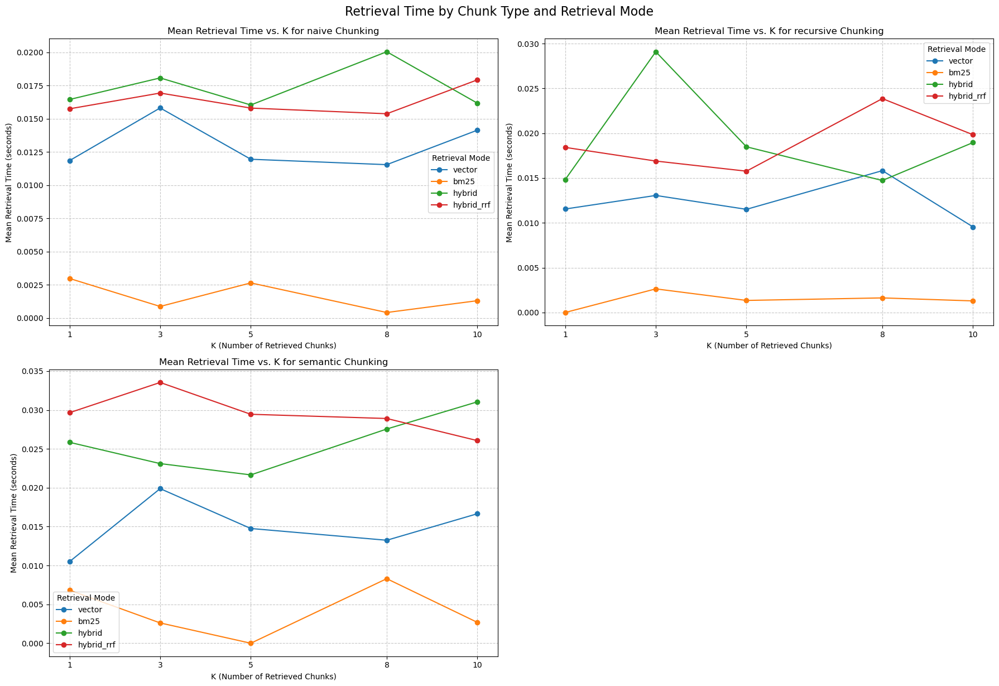

In [99]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assicurati che results_df sia il DataFrame che hai appena stampato e contiene i tuoi risultati

# --- Grafici per la Recall ---
print("\n--- Generazione Grafici Recall ---")
plt.figure(figsize=(18, 12)) # Dimensione generale per il plot

# Loop su ogni tipo di chunking per visualizzare le modalità di retrieval
chunk_types_unique = results_df["chunk_type"].unique()
modes_unique = results_df["mode"].unique()

for i, chunk_type in enumerate(chunk_types_unique):
    plt.subplot(2, 2, i + 1) # Crea una griglia di subplot (2x2 per 4 tipi di chunking)
    subset = results_df[results_df["chunk_type"] == chunk_type]

    for mode in modes_unique:
        mode_data = subset[subset["mode"] == mode]
        if not mode_data.empty: # Assicurati che ci siano dati per questa modalità
            plt.plot(mode_data["k"], mode_data["recall"], marker='o', label=mode)

    plt.title(f'Recall vs. K for {chunk_type} Chunking')
    plt.xlabel('K (Number of Retrieved Chunks)')
    plt.ylabel('Recall')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.xticks(Ks_to_evaluate) # Imposta i tick sull'asse x ai tuoi valori K
    plt.legend(title='Retrieval Mode')
    plt.ylim(0, 1.05) # Limite per la recall

plt.tight_layout()
plt.suptitle('Recall@K Comparison by Chunk Type and Retrieval Mode', y=1.02, fontsize=16) # Titolo generale
plt.show()


# --- Grafici per il Numero Medio di Token Totali ---
print("\n--- Generazione Grafici Numero Medio di Token Totali ---")
plt.figure(figsize=(18, 12)) # Dimensione generale per il plot

for i, chunk_type in enumerate(chunk_types_unique):
    plt.subplot(2, 2, i + 1) # Crea una griglia di subplot (2x2 per 4 tipi di chunking)
    subset = results_df[results_df["chunk_type"] == chunk_type]

    for mode in modes_unique:
        mode_data = subset[subset["mode"] == mode]
        if not mode_data.empty:
            plt.plot(mode_data["k"], mode_data["mean_total_tokens"], marker='o', label=mode)

    plt.title(f'Mean Total Tokens vs. K for {chunk_type} Chunking')
    plt.xlabel('K (Number of Retrieved Chunks)')
    plt.ylabel('Mean Total Tokens')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.xticks(Ks_to_evaluate) # Imposta i tick sull'asse x ai tuoi valori K
    plt.legend(title='Retrieval Mode')

plt.tight_layout()
plt.suptitle('Mean Total Tokens Retrieved Comparison by Chunk Type and Retrieval Mode', y=1.02, fontsize=16)
plt.show()

# --- Grafici Combinati (Recall vs. Mean Total Tokens) ---
# Questo tipo di grafico può essere più complesso da interpretare con molti K e modalità,
# ma può dare un'idea del trade-off.

import math

# Grafico combinato: Recall vs Mean Total Tokens per retrieval mode
print("\n--- Generazione Grafici Combinati (Recall vs. Mean Total Tokens) ---")

valid_modes = [mode for mode in modes_unique if not results_df[results_df['mode'] == mode].empty]
n_plots = len(valid_modes)
n_cols = 2
n_rows = math.ceil(n_plots / n_cols)

plt.figure(figsize=(n_cols * 8, n_rows * 5))

for i, mode in enumerate(valid_modes):
    plt.subplot(n_rows, n_cols, i + 1)
    subset_mode = results_df[results_df["mode"] == mode]

    for chunk_type in chunk_types_unique:
        chunk_data = subset_mode[subset_mode["chunk_type"] == chunk_type]
        if not chunk_data.empty:
            for k_val in Ks_to_evaluate:
                k_data = chunk_data[chunk_data["k"] == k_val]
                if not k_data.empty:
                    plt.scatter(k_data["mean_total_tokens"], k_data["recall"],
                                s=k_val*20,
                                label=f'{chunk_type} (K={k_val})',
                                alpha=0.7)

    plt.title(f'Recall vs. Mean Total Tokens for {mode} Retrieval')
    plt.xlabel('Mean Total Tokens Retrieved')
    plt.ylabel('Recall')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend(title='Chunk Type & K', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.ylim(0, 1.05)
    plt.xscale('log')
    plt.minorticks_off()

plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.suptitle('Recall vs. Mean Total Tokens Retrieved (Combined View)', y=1.02, fontsize=16)
plt.show()



# --- Grafici per il Tempo Medio di Retrieval ---
print("\n--- Generazione Grafici Tempo Medio di Retrieval ---")
plt.figure(figsize=(18, 12))  # Dimensione generale

for i, chunk_type in enumerate(chunk_types_unique):
    plt.subplot(2, 2, i + 1)
    subset = results_df[results_df["chunk_type"] == chunk_type]

    for mode in modes_unique:
        mode_data = subset[subset["mode"] == mode]
        if not mode_data.empty:
            plt.plot(mode_data["k"], mode_data["mean_retrieval_time"], marker='o', label=mode)

    plt.title(f'Mean Retrieval Time vs. K for {chunk_type} Chunking')
    plt.xlabel('K (Number of Retrieved Chunks)')
    plt.ylabel('Mean Retrieval Time (seconds)')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.xticks(Ks_to_evaluate)
    plt.legend(title='Retrieval Mode')

plt.tight_layout()
plt.suptitle('Retrieval Time by Chunk Type and Retrieval Mode', y=1.02, fontsize=16)
plt.show()


## Debugging Failures

In [14]:
import evaluation_utils
importlib.reload(evaluation_utils)
from evaluation_utils import * 

import retrieval_utils
importlib.reload(retrieval_utils)
from retrieval_utils import *

from evaluation_utils import *
from retrieval_utils import *



# 4) Loop sui tipi di chunk e modalità di retrieval
K = 5

# Istanzio un RetrievalSystem per ciascun tipo di chunk
rsys_map = {}
for chunk_type, paths in chunk_types.items():
    # Verifico che i file esistano (opzionale ma consigliato)
    for key in ("index_path", "meta_path", "vecs_path"):
        p = paths[key]
        if not os.path.isfile(p):
            print(f"[WARN] Il file {key} non esiste: {p}")
    # graph_path può essere None o file inesistente se non serve
    rsys = RetrievalSystem(
        faiss_index_path=paths["index_path"],
        meta_path=paths["meta_path"],
        vecs_path=paths["vecs_path"],
        graph_path=paths.get("graph_path"),
        embedding_model_name="all-MiniLM-L6-v2"
    )
    rsys_map[chunk_type] = rsys


# Path to your benchmark
json_file = "../data/benchmarks/qa_benchmark.json"
with open(json_file, "r") as f:
    data = json.load(f)
qa_df = pd.DataFrame(data)

# Filter to AI Act only if desired
ai_act_qa_df = qa_df[qa_df["main_document"] == "AI Act"]


# Se vuoi referenziarli singolarmente:
rsys_naive          = rsys_map["naive"]
rsys_recursive      = rsys_map["recursive"]
rsys_semantic       = rsys_map["semantic"]
rsys_refgraph       = rsys_map["reference_graph"]



df_failures = analyze_retrieval_failures({"reference_graph": rsys_refgraph}, ai_act_qa_df, top_k=5, relaxed=True)



df_failures.head()


[INFO] Analizzando chunk_type: reference_graph
--------------------------------------------------------------------------------
No match found for span: Article 43 in chunk: Recital (173)
recital 173

(173)
In order to ensure that the regulatory framework can be adapted where necessary, the power to adopt acts in accordance with Article 290 TFEU should be delegated to the Commission to amend the conditions under which an AI system is not to be considered to be high-risk, the list of high-risk AI systems, the provisions regarding technical documentation, the content of the EU declaration of conformity the provisions regarding the conformity assessment procedures, the provisions establishing the high-risk AI systems to which the conformity assessment procedure based on assessment of the quality management system and assessment of the technical documentation should apply, the threshold, benchmarks and indicators, including by supplementing those benchmarks and indicators, in the rules fo

,question,gold_spans,chunk_type,retrieval_mode,match,top_k_ids,top_k_scores,top_k_texts
0,Which article of the AI Act mandates a conform...,[Article 43],reference_graph,vector,False,"[rct_173, art_42, art_16, rct_85, art_6]","[0.49000978469848633, 0.5004478096961975, 0.53...",[Recital (173)\nrecital 173\n\n(173)\nIn order...
1,Which article of the AI Act mandates a conform...,[Article 43],reference_graph,hybrid,False,"[rct_78, rct_51, rct_125, rct_3, rct_53]","[0.8591688619026886, 0.8472607433988981, 0.839...",[Recital (78)\nrecital 78\n\n(78)\nThe conform...
2,Which article of the AI Act mandates a conform...,[Article 43],reference_graph,expand,False,"[rct_173, art_42, art_16, rct_85, art_6, anx_I...","[0.49000978469848633, 0.5004478096961975, 0.53...",[Recital (173)\nrecital 173\n\n(173)\nIn order...
3,Which article of the AI Act defines the classi...,[Article 6],reference_graph,hybrid,False,"[rct_3, rct_7, rct_26, rct_8, rct_1]","[0.9077515961805878, 0.8624901517084917, 0.845...",[Recital (3)\nrecital 3\n\n(3)\nAI systems can...
4,Name one sector listed in Annex III of the AI ...,[Biometrics],reference_graph,vector,False,"[art_7, art_6, art_80, art_49, art_60]","[0.6371428966522217, 0.6617770195007324, 0.770...",[Article 7\nAmendments to Annex III\n\nArticle...


## Prompt Engineering

In [2]:
import evaluation_utils
importlib.reload(evaluation_utils)
from evaluation_utils import * 

import retrieval_utils
importlib.reload(retrieval_utils)
from retrieval_utils import *

import prompt_engineering_utils
importlib.reload(prompt_engineering_utils)
from prompt_engineering_utils import *




RECURSIVE_PATHS = {
        "index_path": os.path.join(base_indexes, "ai_act_recursive_chunks", "faiss_index_all-MiniLM-L6-v2.faiss"),
        "meta_path":  os.path.join(base_indexes, "ai_act_recursive_chunks", "chunks_meta_all-MiniLM-L6-v2.pkl"),
        "vecs_path":  os.path.join(base_indexes, "ai_act_recursive_chunks", "chunk_vecs_all-MiniLM-L6-v2.pkl"),
        "graph_path": None
    }


rsys = RetrievalSystem(
    faiss_index_path=RECURSIVE_PATHS["index_path"],
    meta_path=RECURSIVE_PATHS["meta_path"],
    vecs_path=RECURSIVE_PATHS["vecs_path"],
    graph_path=RECURSIVE_PATHS["graph_path"],
    embedding_model_name="all-MiniLM-L6-v2"
)



### Reasoning Agent

In [85]:
import evaluation_utils
importlib.reload(evaluation_utils)
from evaluation_utils import * 

import retrieval_utils
importlib.reload(retrieval_utils)
from retrieval_utils import *

import prompt_engineering_utils
importlib.reload(prompt_engineering_utils)
from prompt_engineering_utils import *


query = "Which are the Obligations of deployers of high-risk AI systems according to the AI Act? Can you quote the whole article that discuss this part?"

answer = run_reasoning_agent(query, rsys)

sub_questions_text 

 subquestion_1: What constitutes a "high-risk AI system" according to the AI Act?
subquestion_2: What specific obligations are imposed on deployers of high-risk AI systems under the AI Act?
subquestion_3: What article of the AI Act outlines the obligations of deployers of high-risk AI systems?
subquestion_4: What is the complete text of the article from the AI Act that details the obligations of deployers of high-risk AI systems?

NUMBER OF SUB-QUESTIONS: 4
Sub-questions generated:
[': What constitutes a "high-risk AI system" according to the AI Act?',
 ': What specific obligations are imposed on deployers of high-risk AI systems '
 'under the AI Act?',
 ': What article of the AI Act outlines the obligations of deployers of '
 'high-risk AI systems?',
 ': What is the complete text of the article from the AI Act that details the '
 'obligations of deployers of high-risk AI systems?']

[INFO] Prompt completo:
----------------------------------------------------------

# Articles MAP

In [10]:
meta_path = "C:/Users/samue/OneDrive/Desktop/unimib/projects/legal-rag-ai/data/indexes/document_reference_graph_chunks/chunks_meta_all-MiniLM-L6-v2.pkl"

with open(meta_path, "rb") as f:
    meta = pickle.load(f)

id_to_meta = {}
for entry in meta:
    cid = entry.get("id")
    if cid is None:
        raise ValueError(f"Entry di metadata senza 'id': {entry}")
    id_to_meta[cid] = entry


json_output_path = "C:/Users/samue/OneDrive/Desktop/unimib/projects/legal-rag-ai/data/indexes/document_reference_graph_chunks/id_to_meta_index.json"

with open(json_output_path, "w", encoding="utf-8") as json_file:
    json.dump(id_to_meta, json_file, indent=4, ensure_ascii=False)

In [137]:
id_to_meta["anx_IV"]

{'id': 'anx_IV',
 'type': 'Annex',
 'number': 'IV',
 'topic': 'ANNEX\xa0IV',
 'ancestors': ['Annexes'],
 'text': 'ANNEX IV – ANNEX\xa0IV\n\nANNEX\xa0IV\nTechnical documentation referred to in Article\xa011(1)\nThe technical documentation referred to in Article\xa011(1) shall contain at least the following information, as applicable to the relevant AI system:\n1.\nA general description of the AI system including:\n(a)\nits intended purpose, the name of the provider and the version of the system reflecting its relation to previous versions;\n(b)\nhow the AI system interacts with, or can be used to interact with, hardware or software, including with other AI systems, that are not part of the AI system itself, where applicable;\n(c)\nthe versions of relevant software or firmware, and any requirements related to version updates;\n(d)\nthe description of all the forms in which the AI system is placed on the market or put into service, such as software packages embedded into hardware, downloa

### Quotes and plan_refinement

In [147]:
import evaluation_utils
importlib.reload(evaluation_utils)
from evaluation_utils import * 

import retrieval_utils
importlib.reload(retrieval_utils)
from retrieval_utils import *

import prompt_engineering_utils
importlib.reload(prompt_engineering_utils)
from prompt_engineering_utils import *


query = "According to the AI Act what should I do to mitigate the risks related to discriminatory biases of an High Risk AI System?"

answer, chunks = ask_gemini_RAG(query, rsys)
# run_reasoning_agent(query, rsys)

print("###"*30)
print("ANSWER:")
print(answer)

eval_report = evaluate_answer(query, chunks, answer)

print("###"*30)
print("EVALUATION REPORT:")
print(eval_report)

gaps = plan_refinement(eval_report)

print("###"*30)
print("GAPS:")
print(gaps)

questions_list = question_refinement(eval_report)

print(type(questions_list))

print("###"*30)
print("QUESTIONS LIST:")
print(questions_list)


extra = fetch_gap_chunks(gaps,
                       article_dict=id_to_meta,
                       chunk_vecs=rsys.chunk_vecs,
                       embedder=rsys.embedder)

print("###"*30)
print("EXTRA CHUNKS:")
print(extra)

new_ctx = chunks + extra
full_prompt  = build_prompt(new_ctx, query)
improved = response_text = get_gemini_response(full_prompt)

print("###"*30)
print("IMPROVED RESPONSE:")
print(improved)


[INFO] Prompt completo:
--------------------------------------------------------------------------------
"
        You are a legal assistant helping users understand the EU AI Act.
        Below is a question and some context extracted from official documents.
        Use only the provided context to answer, and cite relevant Articles or Annexes if possible.
        If the provided context does not contain enough information, respond with "I don't know".

        Context:
     reviewed and updated to ensure its continuing effectiveness, as well as justification and documentation of any  significant decisions and actions taken subject to this Regulation. This process should ensure that the provider  identifies risks or adverse impacts and implements mitigation measures for the known and reasonably foreseeable  risks of AI systems to the health, safety and fundamental rights in light of their intended purpose and reasonably  foreseeable misuse, including the possible risks arising from 

## Evaluator + Questions Refinement

In [156]:
import evaluation_utils
importlib.reload(evaluation_utils)
from evaluation_utils import * 

import retrieval_utils
importlib.reload(retrieval_utils)
from retrieval_utils import *

import prompt_engineering_utils
importlib.reload(prompt_engineering_utils)
from prompt_engineering_utils import *


query = "According to the AI Act what should I do to mitigate the risks related to discriminatory biases of an High Risk AI System?"

answer, chunks = ask_gemini_RAG(query, rsys)
# run_reasoning_agent(query, rsys)

print("###"*30)
print("ANSWER:")
print(answer)

eval_report = evaluate_answer(query, chunks, answer)

print("###"*30)
print("EVALUATION REPORT:")
print(eval_report)


question_refinement(query, answer, eval_report, rsys)


[INFO] Prompt completo:
--------------------------------------------------------------------------------
"
        You are a legal assistant helping users understand the EU AI Act.
        Below is a question and some context extracted from official documents.
        Use only the provided context to answer, and cite relevant Articles or Annexes if possible.
        If the provided context does not contain enough information, respond with "I don't know".

        Context:
     reviewed and updated to ensure its continuing effectiveness, as well as justification and documentation of any  significant decisions and actions taken subject to this Regulation. This process should ensure that the provider  identifies risks or adverse impacts and implements mitigation measures for the known and reasonably foreseeable  risks of AI systems to the health, safety and fundamental rights in light of their intended purpose and reasonably  foreseeable misuse, including the possible risks arising from 

'To mitigate the risks related to discriminatory biases in a High-Risk AI System according to the AI Act, you should focus on data quality and statistical properties of the datasets used. Data sets for training, validation, and testing should be relevant, sufficiently representative, and to the best extent possible free of errors and complete in view of the intended purpose of the system (Article 10(5)). These datasets shall have the appropriate statistical properties, including regarding the persons or groups of persons for whom the high-risk AI system is intended (OJ L, 12.7.2024 EN ELI: http://data.europa.eu/eli/reg/2024/1689/oj 57/144). Data sets shall also take into account characteristics or elements that are particular to the specific geographical, contextual, behavioural or functional setting within which the high-risk AI system is intended to be used (OJ L, 12.7.2024 EN ELI: http://data.europa.eu/eli/reg/2024/1689/oj 57/144).\n\nTo the extent that it is strictly necessary for 

In [153]:
import evaluation_utils
importlib.reload(evaluation_utils)
from evaluation_utils import * 

import retrieval_utils
importlib.reload(retrieval_utils)
from retrieval_utils import *

import prompt_engineering_utils
importlib.reload(prompt_engineering_utils)
from prompt_engineering_utils import *

question_refinement(query, answer, eval_report, rsys)

GAPS QUESTIONS LIST RAW
What specific steps does Article 10, paragraph 5 of the AI Act outline for bias detection and correction in high-risk AI systems?, According to Article 10(2)(f) and (g) of the AI Act, what data-related measures can be implemented to mitigate discriminatory biases?, What testing procedures are recommended or required by the AI Act to identify and correct discriminatory biases in high-risk AI systems?, Can you provide examples of practical mitigation strategies that providers of high-risk AI systems can implement to address discriminatory biases?

Number of questions: 5

[INFO] Prompt completo:
--------------------------------------------------------------------------------
"
        You are a legal assistant helping users understand the EU AI Act.
        Below is a question and some context extracted from official documents.
        Use only the provided context to answer, and cite relevant Articles or Annexes if possible.
        If the provided context does no

"To mitigate the risks related to discriminatory biases in a High-Risk AI System according to the AI Act, you should implement several measures throughout the AI system's lifecycle. These measures involve data examination, bias detection, prevention, and mitigation strategies.\n\nFirst, Article 10(2)(f) and (g) requires you to examine your AI system for potential biases that could affect health, safety, fundamental rights, or lead to discrimination prohibited under Union law, particularly where data outputs influence future operations. You should then implement appropriate measures to detect, prevent, and mitigate any biases identified.\n\nData-related measures are crucial. Ensure the data sets used are complete and free of errors and address any feedback loops with appropriate mitigation measures (Art. 10(2)(f) and (g)). You can process special categories of personal data if it is strictly necessary for bias detection and correction, subject to conditions outlined in Article 9(1) of R

### get_more_info feature

In [16]:
import evaluation_utils
importlib.reload(evaluation_utils)
from evaluation_utils import * 

import retrieval_utils
importlib.reload(retrieval_utils)
from retrieval_utils import *

import prompt_engineering_utils
importlib.reload(prompt_engineering_utils)
from prompt_engineering_utils import *

import gemini_utils
importlib.reload(gemini_utils)
from gemini_utils import *


query = "According to the AI Act what should I do to mitigate the risks related to discriminatory biases of an High Risk AI System?"

answer, chunks = ask_gemini_RAG(query, rsys)
# run_reasoning_agent(query, rsys)

print("###"*30)
print("ANSWER:")
print(answer)

eval_report = evaluate_answer(query, chunks, answer)

print("###"*30)
print("EVALUATION REPORT:")
print(eval_report)


text_lean_list = get_sources_tool(query, answer, eval_report)

new_ctx = text_lean_list # chunks + 
full_prompt  = build_prompt(new_ctx, query)
improved =  generate_gemini_content(full_prompt)

print("###"*30)
print("IMPROVED RESPONSE:")
print(improved)


[INFO] Prompt completo:
--------------------------------------------------------------------------------
"
        You are a legal assistant helping users understand the EU AI Act.
        Below is a question and some context extracted from official documents.
        Use only the provided context to answer, and cite relevant Articles or Annexes if possible.
        If the provided context does not contain enough information, respond with "I don't know".

        Context:
     reviewed and updated to ensure its continuing effectiveness, as well as justification and documentation of any  significant decisions and actions taken subject to this Regulation. This process should ensure that the provider  identifies risks or adverse impacts and implements mitigation measures for the known and reasonably foreseeable  risks of AI systems to the health, safety and fundamental rights in light of their intended purpose and reasonably  foreseeable misuse, including the possible risks arising from 

## Parsing the evaluator

In [18]:
import evaluation_utils
importlib.reload(evaluation_utils)
from evaluation_utils import * 

import retrieval_utils
importlib.reload(retrieval_utils)
from retrieval_utils import *

import prompt_engineering_utils
importlib.reload(prompt_engineering_utils)
from prompt_engineering_utils import *

import gemini_utils
importlib.reload(gemini_utils)
from gemini_utils import *


query = "A developer wants to integrate a language model in a medical app. Which Annex risk should he checks to verify if that AI system shall be considered to be high-risk?"

answer, chunks = ask_gemini_RAG(query, rsys)
# run_reasoning_agent(query, rsys)

print("###"*30)
print("ANSWER:")
print(answer)

eval_report = evaluate_answer(query, chunks, answer)

print("###"*30)
print("EVALUATION REPORT:")
print(eval_report)

parse_evaluation_report(eval_report)

text_lean_list = get_sources_tool(query, answer, eval_report)

new_ctx = chunks + text_lean_list # 
full_prompt  = build_prompt(new_ctx, query)
improved =  generate_gemini_content(full_prompt)

print("###"*30)
print("IMPROVED RESPONSE:")
print(improved)


eval_report = evaluate_answer(query, chunks, improved)

print("###"*30)
print("EVALUATION REPORT:")
print(eval_report)

parse_evaluation_report(eval_report)


[INFO] Prompt completo:
--------------------------------------------------------------------------------
"
        You are a legal assistant helping users understand the EU AI Act.
        Below is a question and some context extracted from official documents.
        Use only the provided context to answer, and cite relevant Articles or Annexes if possible.
        If the provided context does not contain enough information, respond with "I don't know".

        Context:
     Article 74(8) or (9), as applicable, shall act as a notified body. 2. For high-risk AI systems referred to in points 2 to 8 of Annex III, providers shall follow the conformity assessment  procedure based on internal control as referred to in Annex VI, which does not provide for the involvement of a notified  body. 3. For high-risk AI systems covered by the Union harmonisation legislation listed in Section A of Annex I, the provider  shall follow the relevant conformity assessment procedure as required under thos

{'groundedness': None,
 'relevance': None,
 'structure': None,
 'hallucinations': None}

### Checking the level of knowledge of EleutherAI/gpt-neo-1.3B  about AI  - 2048 token di contesto

In [ ]:
# scarica modello e relativi pesi
from transformers import AutoModelForCausalLM, AutoTokenizer, pipeline

model_name = "EleutherAI/gpt-neo-1.3B"  # o un altro modello leggero
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForCausalLM.from_pretrained(model_name)
generator = pipeline("text-generation", model=model, tokenizer=tokenizer)
prompt = "What do you know about the EU's AI Act?"
out = generator(prompt, max_length=200)[0]["generated_text"]
print(out)


In [68]:
import time

generator = pipeline("text-generation", model=model, tokenizer=tokenizer)
prompt = "Which article of the AI Act mandates a conformity assessment for high-risk AI systems?"

start = time.perf_counter()
out = generator(prompt, max_length=200)[0]["generated_text"]
elapsed = time.perf_counter() - start

print(out)

print(f"Risposta generata in {elapsed:.2f} secondi:")

Device set to use cpu
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Both `max_new_tokens` (=256) and `max_length`(=200) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


Which article of the AI Act mandates a conformity assessment for high-risk AI systems? No, we believe that it does not yet.

For years, we have been advocating a regulatory framework for Artificial Intelligence. We call this the AI Act.

The AI Act is a proposal by the Department of Homeland Security. It is currently being considered in two Congress committees, as well as the White House.

The AI Act would mandate that companies and other entities, which make decisions on behalf of the US government, make a conformity assessment to assess when AI systems are deployed that are high-risk, whether by their creators or others.

The purpose of this conformity assessment is to determine what should be done to make AI systems more consistent with the US Constitution and relevant laws, with the aim of reducing the risks of those systems.

Why is this important?

The purpose of making a conformity assessment is to ensure that our agencies – and society – are protected from potential AI incident

### Checking the level of knowledge of Gemini 2.5 Pro

In [67]:
import evaluation_utils
importlib.reload(evaluation_utils)
from evaluation_utils import * 

import retrieval_utils
importlib.reload(retrieval_utils)
from retrieval_utils import *

import prompt_engineering_utils
importlib.reload(prompt_engineering_utils)
from prompt_engineering_utils import * 


context = "of AI systems for remote biometric identification for the purpose of \nlaw enforcement, of the use of AI systems for risk assessments of natural persons for the purpose of law \nenforcement and of the use of AI systems of biometric categorisation for the purpose of law enforcement, it is \nappropriate to base this Regulation, in so far as those specific rules are concerned, on Article 16 TFEU. In light of \nthose specific rules and the recourse to Article 16 TFEU, it is appropriate to consult the European Data Protection \nBoard.\n(4)\nAI is a fast evolving family of technologies that contributes to a wide array of economic, environmental and societal \nbenefits across the entire spectrum of industries and social activities. By improving prediction, optimising operations \nand resource allocation, and personalising digital solutions available for individuals and organisations, the use of AI \ncan provide key competitive advantages to undertakings and support socially and environmentally benefic"


question = "Which article of the AI Act mandates a conformity assessment for high-risk AI systems? \n" 
constraint = f"Please, answer to the question using only the information reported below: {context}"

final_prompt = question + constraint
try:
    response = generate_gemini_content(prompt_text=final_prompt)
    # Stampa la parte generata:
    print(json.dumps(response, indent=2, ensure_ascii=False))
except Exception as e:
    print(f"Errore: {e}")

{
  "candidates": [
    {
      "content": {
        "parts": [
          {
            "text": "The provided text does not contain information about the specific article of the AI Act that mandates a conformity assessment for high-risk AI systems.\n"
          }
        ],
        "role": "model"
      },
      "finishReason": "STOP",
      "avgLogprobs": -0.11607087509972709
    }
  ],
  "usageMetadata": {
    "promptTokenCount": 229,
    "candidatesTokenCount": 28,
    "totalTokenCount": 257,
    "promptTokensDetails": [
      {
        "modality": "TEXT",
        "tokenCount": 229
      }
    ],
    "candidatesTokensDetails": [
      {
        "modality": "TEXT",
        "tokenCount": 28
      }
    ]
  },
  "modelVersion": "gemini-2.0-flash",
  "responseId": "uABZaOKXKJTehMIPyoOx2As"
}


# RAG PIPELINE

In [45]:
import prompt_engineering_utils
importlib.reload(prompt_engineering_utils)
from prompt_engineering_utils import * 

import retrieval_utils
importlib.reload(retrieval_utils)
from retrieval_utils import *

import orchestrator
importlib.reload(orchestrator)
from orchestrator import * 


question = "How does Article 43 of the AI Act relate to the GDPR's requirements for data protection impact assessments?"

rag_pipeline(question, fallback="hyde")

List of question SUBJECTS: 
AI_Act, GDPR

Using mode: vector
Using mode: vector
FINAL RANK COMPOSITION: 
         id  text  score  source  source_file  offset
subject                                              
GDPR      7     7      7       7            7       7
ai_act    5     5      5       5            5       5

[INFO] Prompt completo:
--------------------------------------------------------------------------------
"
        You are a legal assistant helping users understand the EU AI Act, the GDPR law.
        Below is a question and some context extracted from official documents.
        Use only the provided context to answer, and cite relevant Articles or Annexes if possible.
        If the provided context does not contain enough information, respond with "I don't know".

        Context:
     conducted pursuant to Article 35 of Regulation (EU) 2016/679 or Article 27 of Directive (EU) 2016/680, the fundamental  rights impact assessment referred to in paragraph 1 of this Ar

In [2]:
import prompt_engineering_utils
importlib.reload(prompt_engineering_utils)
from prompt_engineering_utils import * 

import retrieval_utils
importlib.reload(retrieval_utils)
from retrieval_utils import *

import orchestrator
importlib.reload(orchestrator)
from orchestrator import * 


import time
with open("../data/benchmarks/qa_benchmark.json", "r", encoding="utf-8") as f:
    qa_benchmark = json.load(f)

FALLBACKS = ["IRCoT"]  #, "IRCoT, "hyde
# qa_benchmark = qa_benchmark[27:]

list_payloads = []

try:
    for fallback_type in FALLBACKS:
        for question_block in qa_benchmark:
            return_payload = rag_pipeline(question_block["question"], fallback=fallback_type, always_fallback=True)
            return_payload["complexity"] = question_block["complexity"]
            return_payload["subject"] = question_block["main_document"]
            list_payloads.append(return_payload)
            time.sleep(60)
except Exception as e:
    print(str(e))
    print(len(list_payloads))

    list_payloads_df = pd.DataFrame(list_payloads)
    list_payloads_df.to_csv("results_IRCoT_v0.csv")

List of question SUBJECTS: 
GDPR

Using mode: vector
FINAL RANK COMPOSITION: 
         id  text  score  source  source_file  offset
subject                                              
GDPR     10    10     10      10           10      10

[INFO] Prompt completo:
--------------------------------------------------------------------------------
"
        You are a legal assistant helping users understand the GDPR law.
        Below is a question and some context extracted from official documents.
        Use only the provided context to answer, and cite relevant Articles or Annexes if possible.
        If the provided context does not contain enough information, respond with "I don't know".

        Context:
     I  (Legislative acts)  REGULATIONS  REGULATION (EU) 2016/679 OF THE EUROPEAN PARLIAMENT AND OF THE COUNCIL  of 27 April 2016  on the protection of natural persons with regard to the processing of personal data and on the free  movement of such data, and repealing Directive 95/4

In [92]:
list_payloads_df = pd.DataFrame(list_payloads)
list_payloads_df.to_csv("results_IRCoT_v2.csv")

In [83]:
with open("../data/benchmarks/qa_benchmark.json", "r", encoding="utf-8") as f:
    qa_benchmark = json.load(f)

qa_benchmark[27:]

[{'question': "What is the definition of an 'AI system' according to the AI Act?",
  'answer': '‘AI system’ means a machine-based system that is designed to operate with varying levels of autonomy and that may exhibit adaptiveness after deployment, and that, for explicit or implicit objectives, infers, from the input it receives, how to generate outputs such as predictions, content, recommendations, or decisions that can influence physical or virtual environments;',
  'coverage': 'Definition-level',
  'complexity': 'Single-hop',
  'answer_length': 'short',
  'sources': 'Article 3(1)',
  'answer_span': ['machine-based system that is designed to operate with varying levels of autonomy'],
  'main_document': 'AI Act'},
 {'question': 'Which Article prohibits placing on the market biometric categorisation systems unless strictly necessary?',
  'answer': 'Article 5',
  'coverage': 'Article-level',
  'complexity': 'Single-hop',
  'answer_length': 'short',
  'sources': 'Article 5',
  'answer_sp

In [58]:
list_payloads_df.columns

Index(['first_call_elapsed', 'fallback_elapsed', 'total_api_call', 'fallback',
       'fallback_Groundedness', 'fallback_Relevance', 'fallback_Structure',
       'fallback_Hallucinations', 'direct_Groundedness', 'direct_Relevance',
       'direct_Structure', 'direct_Hallucinations', 'complexity', 'subject'],
      dtype='object')

In [60]:
list_payloads_df[['direct_Groundedness', 'direct_Relevance', 'direct_Structure', 'direct_Hallucinations']]

,direct_Groundedness,direct_Relevance,direct_Structure,direct_Hallucinations
0,5.0,5.0,2016.0,4.0
1,NaN,NaN,NaN,NaN
2,5.0,5.0,4.0,5.0
3,3.0,3.0,4.0,5.0
4,5.0,5.0,5.0,5.0
5,5.0,5.0,4.0,5.0
6,5.0,5.0,5.0,5.0
7,5.0,5.0,5.0,5.0
8,5.0,5.0,5.0,5.0
9,5.0,5.0,4.0,5.0


In [61]:
list_payloads_df[['fallback_Groundedness', 'fallback_Relevance', 'fallback_Structure', 'fallback_Hallucinations']]

,fallback_Groundedness,fallback_Relevance,fallback_Structure,fallback_Hallucinations
0,5,5,4,5
1,5,5,4,5
2,5,5,4,5
3,5,5,4,5
4,5,5,5,5
5,1,1,3,5
6,5,5,5,5
7,5,5,5,5
8,5,5,5,5
9,5,5,4,5


In [63]:
list_payloads_df.fallback_Relevance.mean()

3.4761904761904763

In [64]:
list_payloads_df.direct_Relevance.mean()

4.05

# Fallback Evaluation

C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in means.index])
C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in means.index])
C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in 

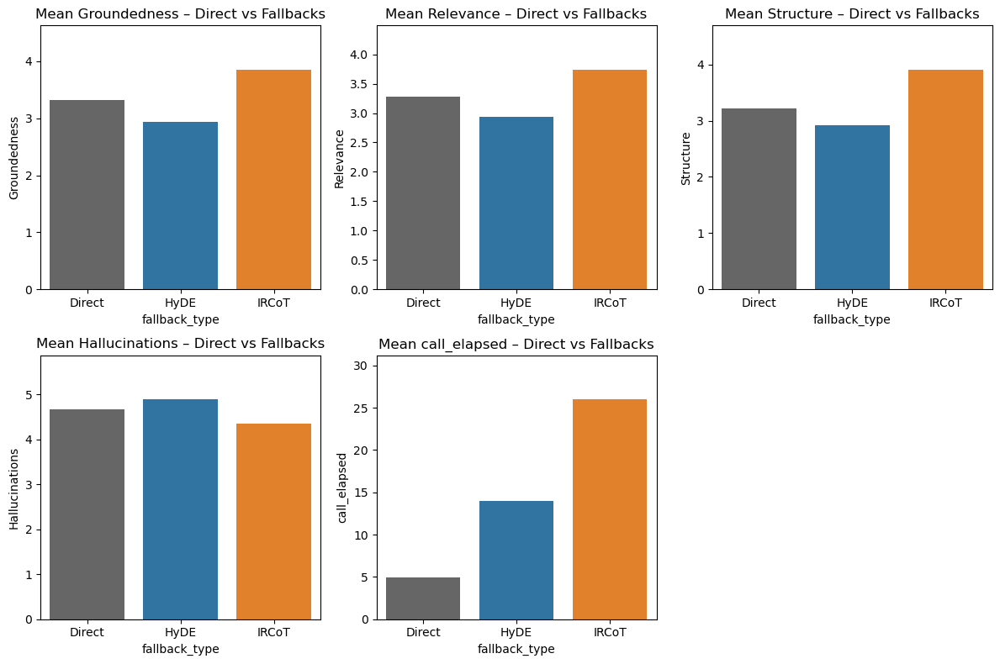

C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in means.index])
C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in means.index])
C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in 

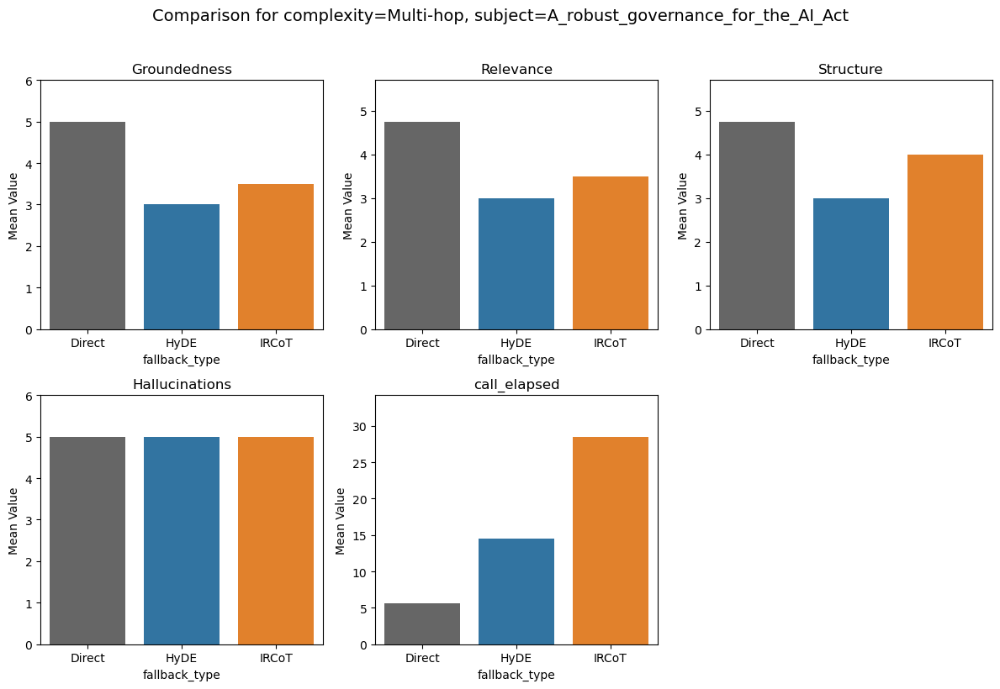

C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in means.index])
C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in means.index])
C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in 

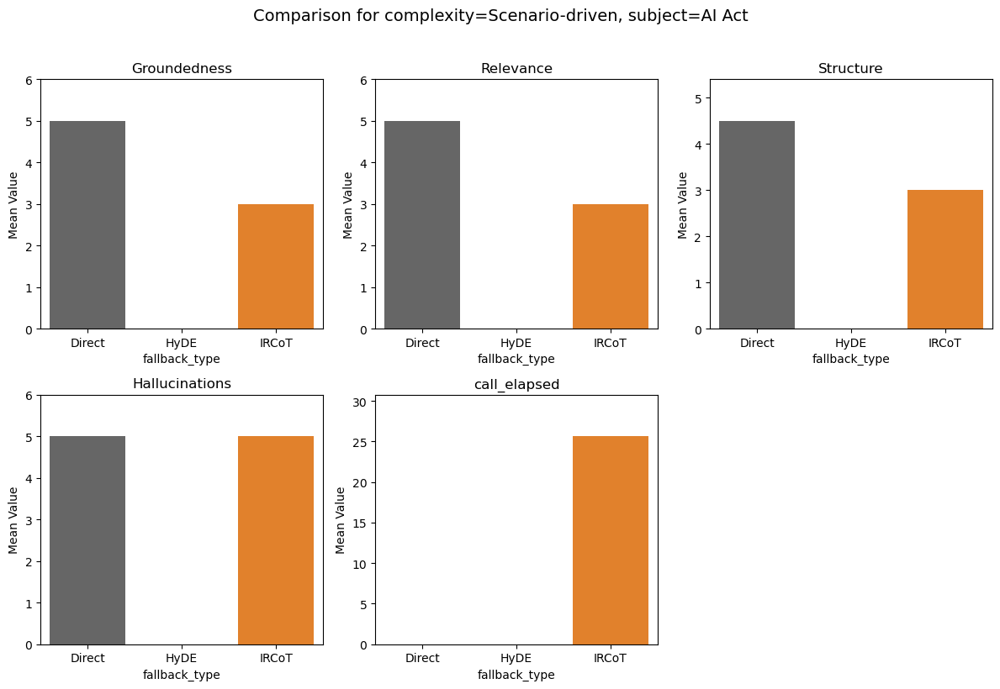

C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in means.index])
C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in means.index])
C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in 

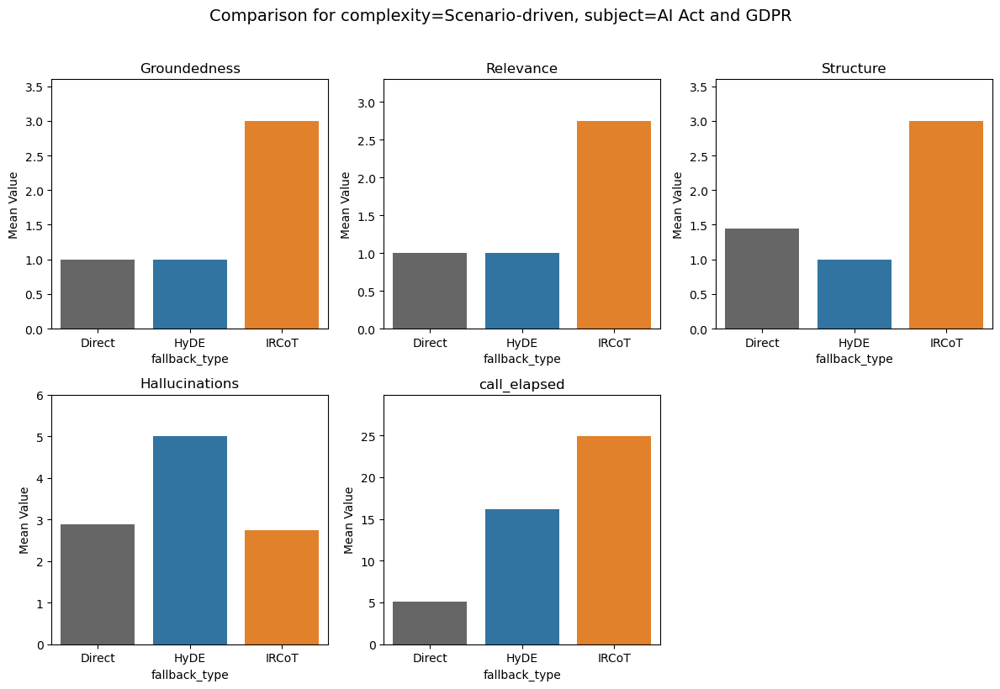

C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in means.index])
C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in means.index])
C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in 

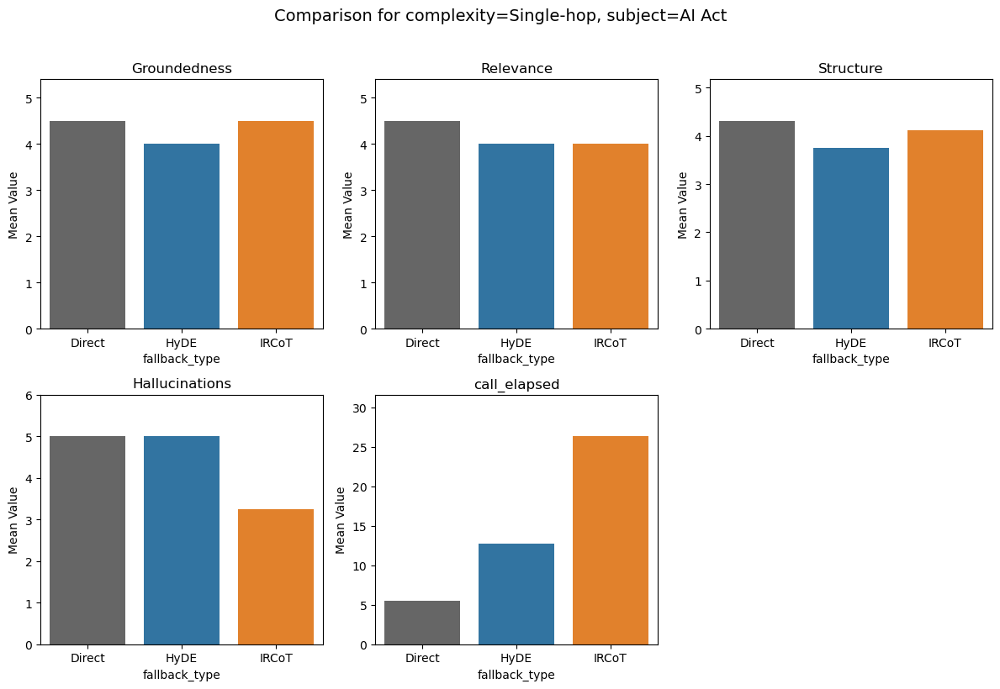

C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in means.index])
C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in means.index])
C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in 

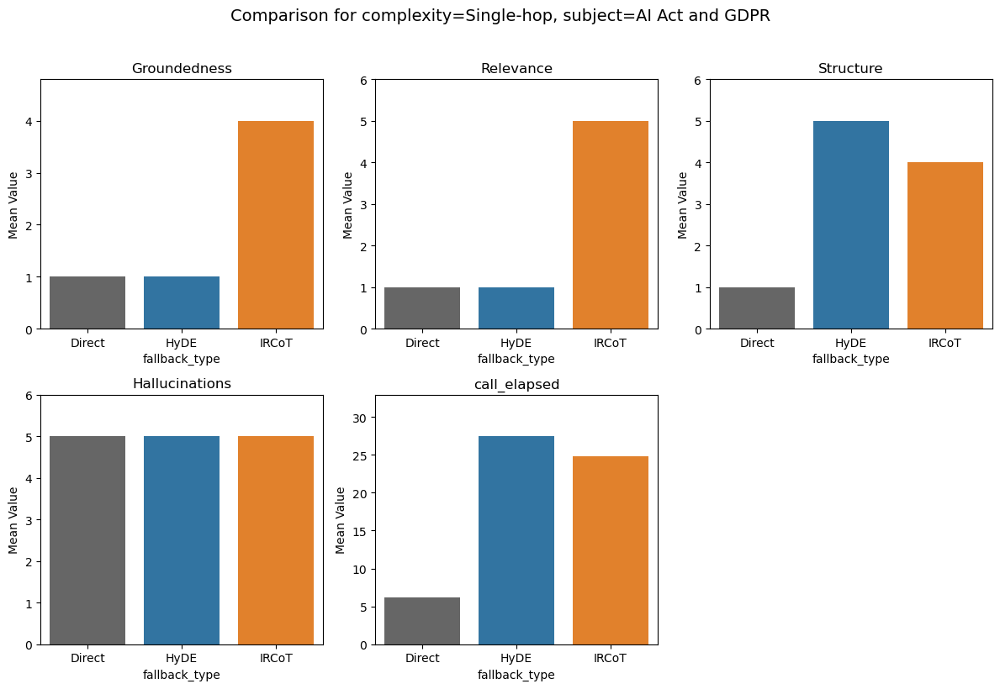

C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in means.index])
C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in means.index])
C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in 

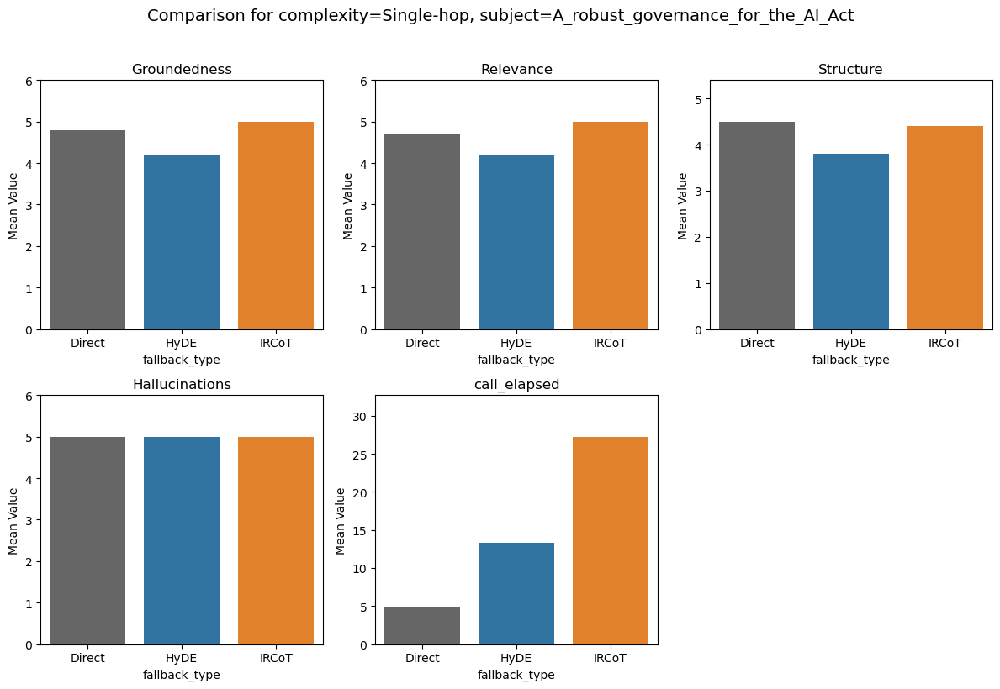

C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in means.index])
C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in means.index])
C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in 

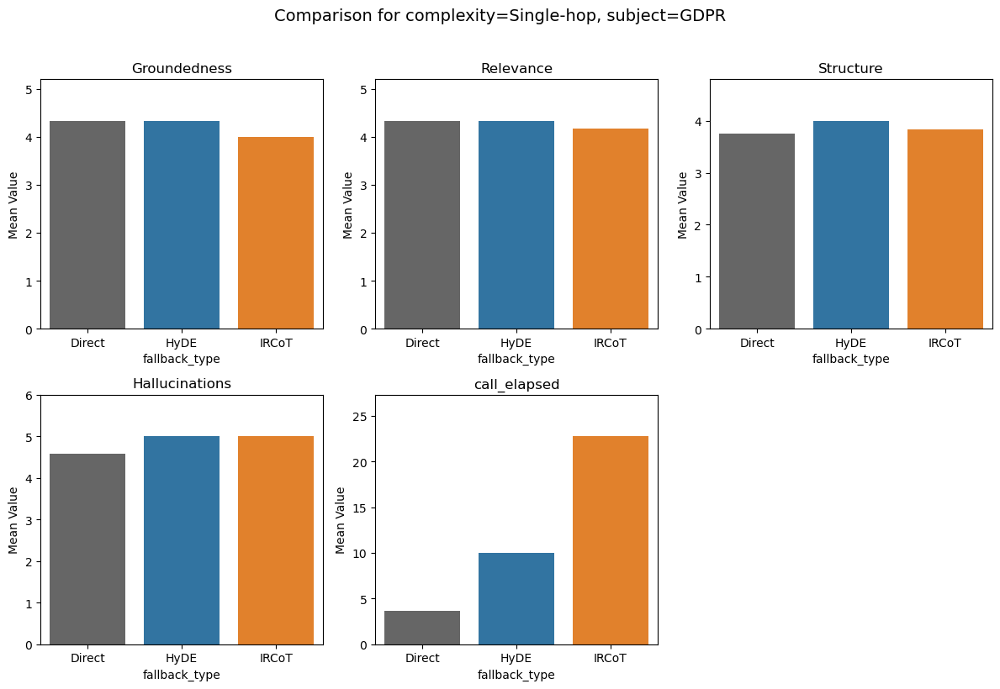

C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in means.index])
C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in means.index])
C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in 

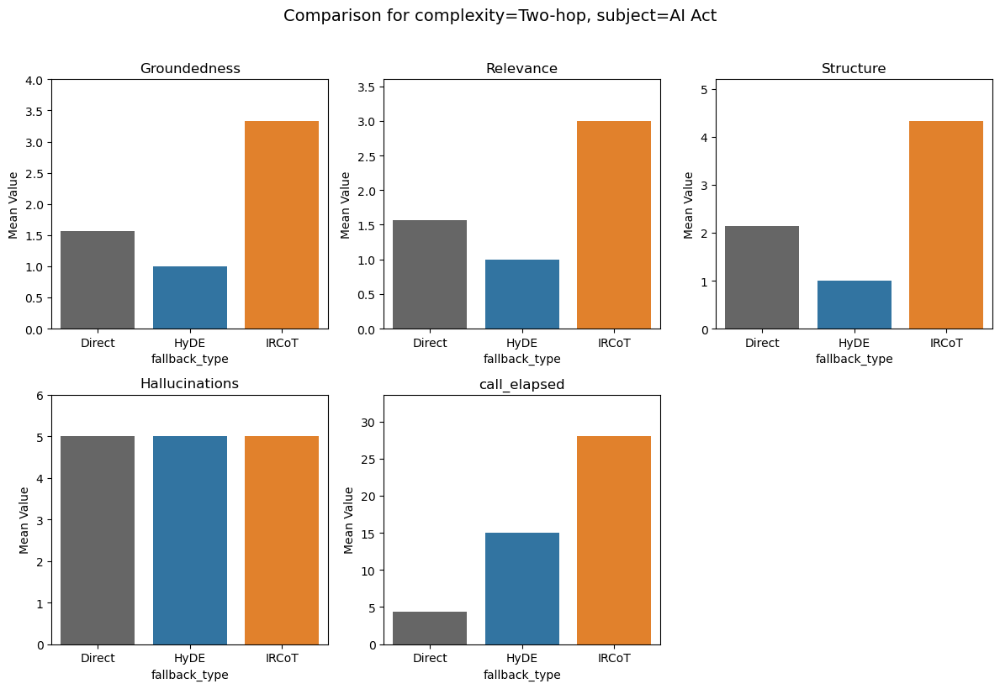

C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in means.index])
C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in means.index])
C:\Users\samue\AppData\Local\Temp\ipykernel_5920\2167761239.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in 

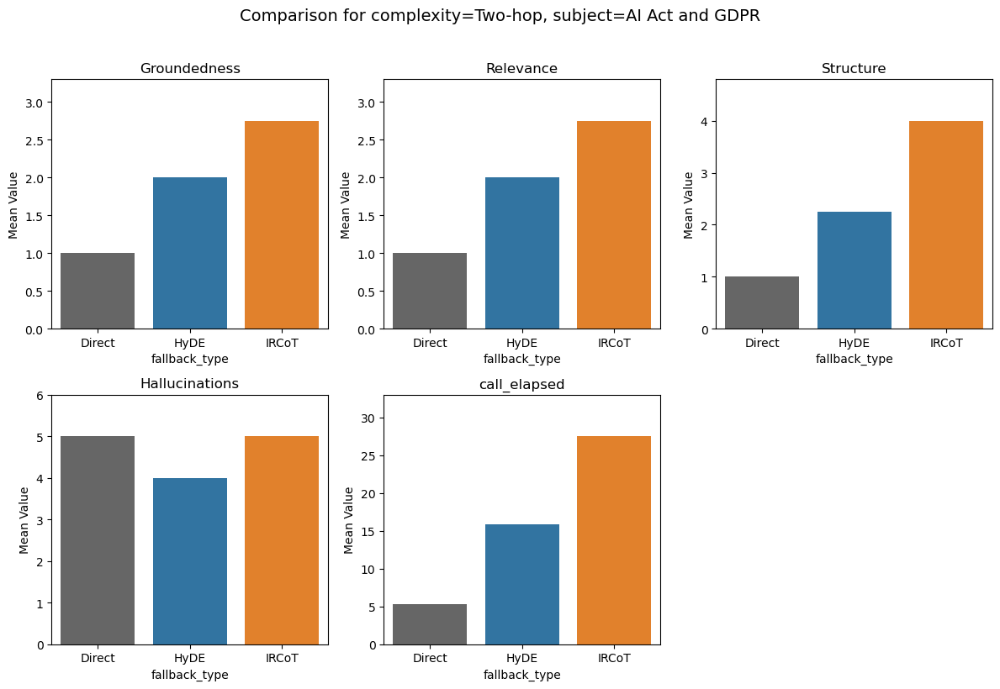

In [6]:
base_path = "../data/results/"

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the datasets
hyde_df = pd.read_csv(base_path + 'results_hyde.csv')
ircot_df = pd.read_csv(base_path + 'results_IRCoT.csv')

# Aggiungi una colonna che indica il tipo di fallback
hyde_df["fallback_type"] = "HyDE"
ircot_df["fallback_type"] = "IRCoT"

# Unisci in un unico DataFrame
df = pd.concat([hyde_df, ircot_df], ignore_index=True)

# 2) Definisci le metriche da considerare
metrics = ["Groundedness", "Relevance", "Structure", "Hallucinations", "call_elapsed"]

# 3) Prepara un DataFrame long per le metriche Direct vs Fallback
rows = []
for _, row in df.iterrows():
    for m in metrics:
        # Direct
        rows.append({
            "fallback_type": "Direct",
            "metric": m,
            "value": row[f"direct_{m}"],
            "complexity": row["complexity"],
            "subject": row["subject"]
        })
        # Fallback
        rows.append({
            "fallback_type": row["fallback_type"],
            "metric": m,
            "value": row[f"fallback_{m}"] if m != "call_elapsed" else row["fallback_elapsed"],
            "complexity": row["complexity"],
            "subject": row["subject"]
        })

long_df = pd.DataFrame(rows)

# Colori ordinati
palette = {"Direct": "#666666", "HyDE": "#1f77b4", "IRCoT": "#ff7f0e"}

# 4) Grafici globali: media delle tre modalità per ciascuna metrica
plt.figure(figsize=(12, 8))
for i, m in enumerate(metrics, 1):
    plt.subplot(2, 3, i)
    sub = long_df[long_df["metric"] == m]
    means = sub.groupby("fallback_type")["value"].mean().reindex(["Direct","HyDE","IRCoT"])
    sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in means.index])
    plt.title(f"Mean {m} – Direct vs Fallbacks")
    plt.ylabel(m)
    plt.ylim(0, means.max()*1.2)
plt.tight_layout()
plt.show()


# 5) Grafici per (complexity, subject)
group_keys = ["complexity", "subject"]
combos = long_df.groupby(group_keys).size().index

for comp, subj in combos:
    subset = long_df[(long_df["complexity"]==comp) & (long_df["subject"]==subj)]
    if subset.empty: 
        continue
    plt.figure(figsize=(12, 8))
    plt.suptitle(f"Comparison for complexity={comp}, subject={subj}", y=1.02, fontsize=14)
    for i, m in enumerate(metrics, 1):
        plt.subplot(2, 3, i)
        grp = subset[subset["metric"]==m]
        means = grp.groupby("fallback_type")["value"].mean().reindex(["Direct","HyDE","IRCoT"])
        sns.barplot(x=means.index, y=means.values, palette=[palette[x] for x in means.index])
        plt.title(m)
        plt.ylabel("Mean Value")
        plt.ylim(0, means.max()*1.2)
    plt.tight_layout()
    plt.show()


## Looking for Patterns - Subject

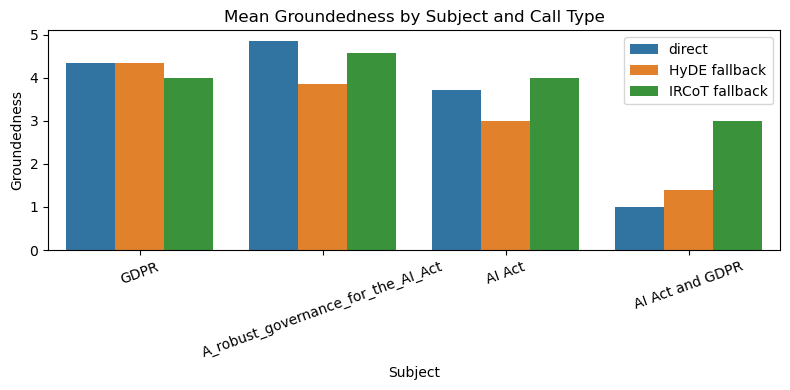

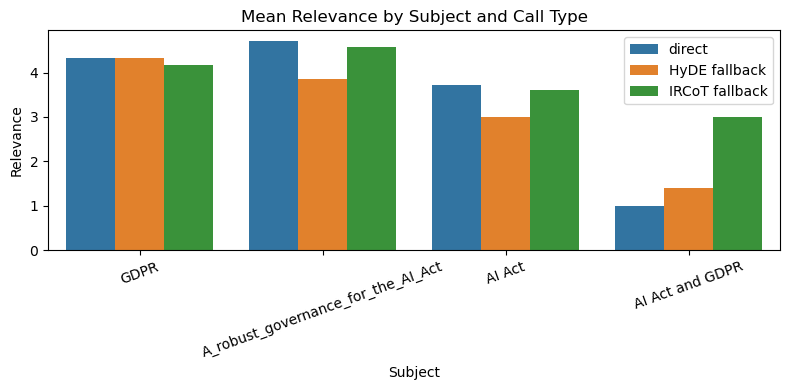

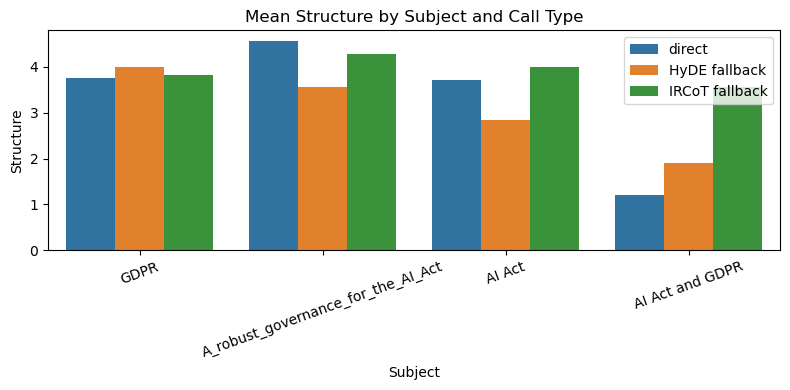

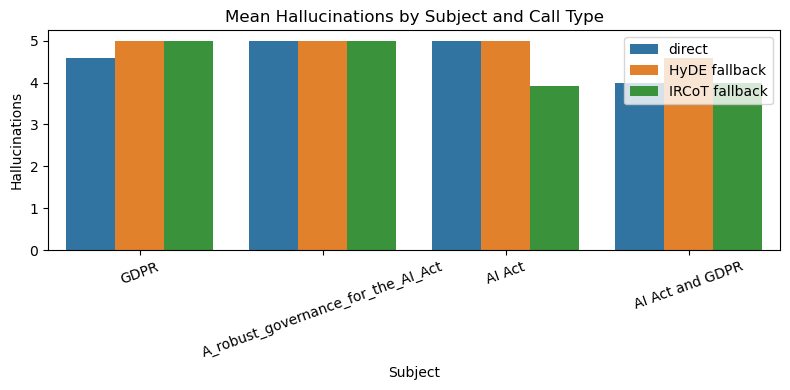

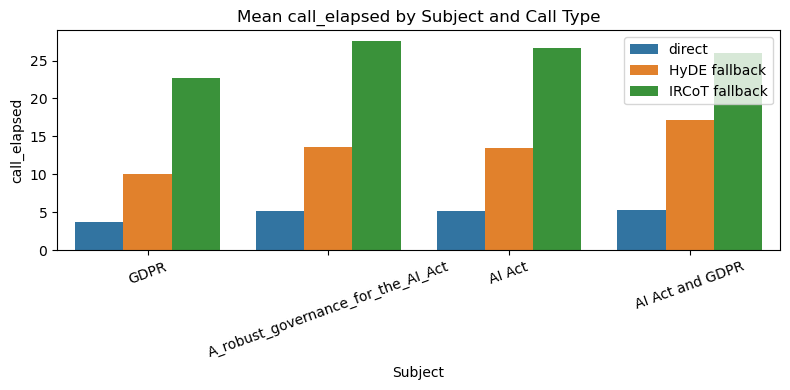

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the datasets
df_hyde = pd.read_csv(base_path + 'results_hyde.csv')
df_ircot = pd.read_csv(base_path + 'results_IRCoT.csv')
df = pd.concat([df_hyde, df_ircot], ignore_index=True)

# Assicuriamoci che i valori in df['fallback'] siano lowercase
df['fallback'] = df['fallback'].str.lower()

# 2) Definisci le metriche da plottare
rating_metrics = ["Groundedness", "Relevance", "Structure", "Hallucinations"]
time_metrics   = ["call_elapsed"]
all_metrics    = rating_metrics + time_metrics

# 3) Mappa di quali colonne usare per direct vs fallback
col_map = {
    **{m: f"direct_{m}"   for m in rating_metrics},
    **{m: f"direct_{m}"   for m in time_metrics},
}
fb_map = {
    **{m: f"fallback_{m}" for m in rating_metrics},
    **{m: "fallback_elapsed" for m in time_metrics},
}

# 4) Loop su ciascuna metrica e creazione del bar‐plot
for m in all_metrics:
    records = []
    for subj in df['subject'].unique():
        subdf = df[df['subject']==subj]
        # direct
        d = subdf[col_map[m]].mean()
        records.append({'subject': subj, 'call_type': 'direct', 'value': d})
        # hyde
        hy = subdf[subdf['fallback']=='hyde'][fb_map[m]].mean()
        records.append({'subject': subj, 'call_type': 'HyDE fallback', 'value': hy})
        # ircot
        ir = subdf[subdf['fallback']=='ircot'][fb_map[m]].mean()
        records.append({'subject': subj, 'call_type': 'IRCoT fallback', 'value': ir})

    plot_df = pd.DataFrame(records)
    plt.figure(figsize=(8, 4))
    sns.barplot(
        data=plot_df,
        x='subject',
        y='value',
        hue='call_type'
    )
    plt.title(f"Mean {m} by Subject and Call Type")
    plt.ylabel(m)
    plt.xlabel("Subject")
    plt.xticks(rotation=20)
    plt.legend(title="")
    plt.tight_layout()
    plt.show()


## Looking for Patterns - Complexity

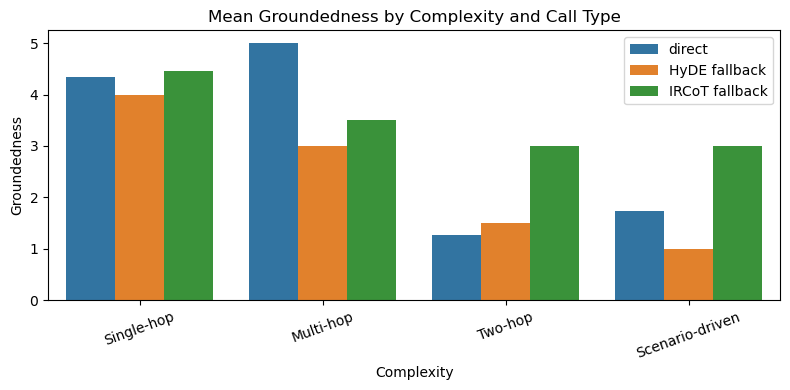

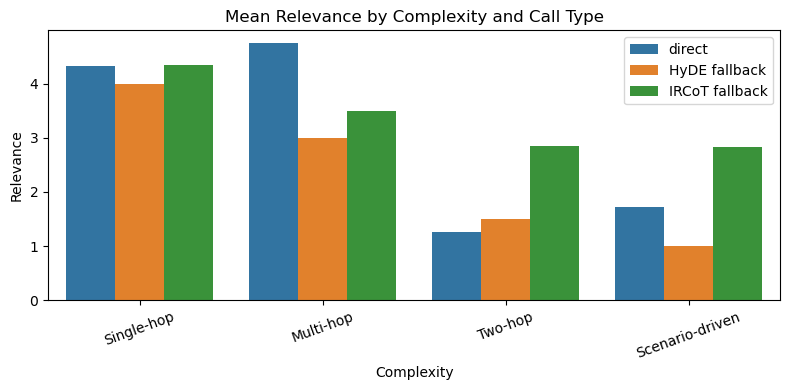

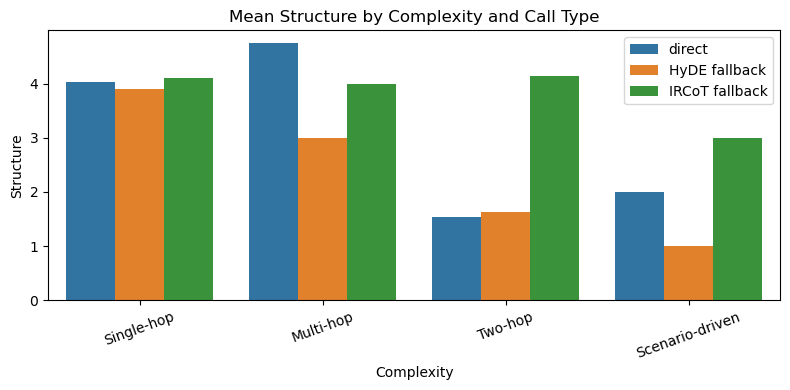

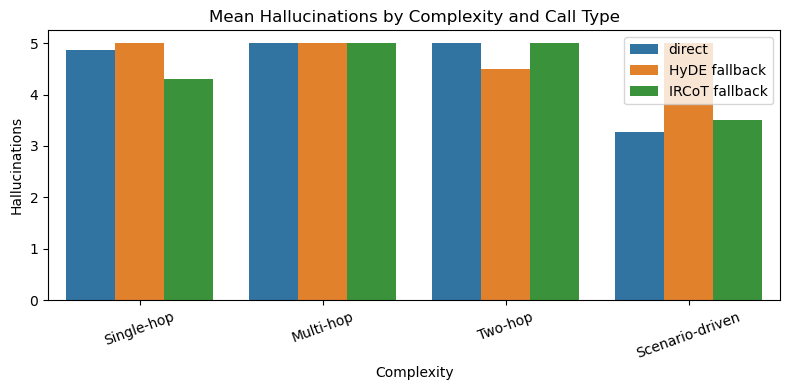

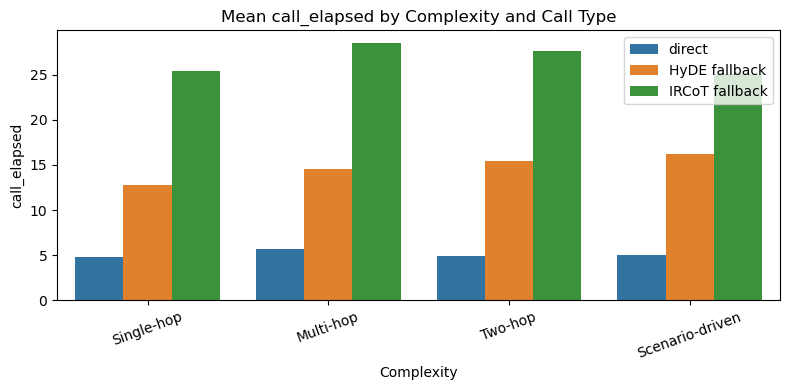

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the datasets
df_hyde = pd.read_csv(base_path + 'results_hyde.csv')
df_ircot = pd.read_csv(base_path + 'results_IRCoT.csv')
df = pd.concat([df_hyde, df_ircot], ignore_index=True)

# Assicuriamoci che i valori in df['fallback'] siano lowercase
df['fallback'] = df['fallback'].str.lower()

# 2) Definisci le metriche da plottare
rating_metrics = ["Groundedness", "Relevance", "Structure", "Hallucinations"]
time_metrics   = ["call_elapsed"]
all_metrics    = rating_metrics + time_metrics

# 3) Mappa di quali colonne usare per direct vs fallback
col_map = {
    **{m: f"direct_{m}"   for m in rating_metrics},
    **{m: f"direct_{m}"   for m in time_metrics},
}
fb_map = {
    **{m: f"fallback_{m}" for m in rating_metrics},
    **{m: "fallback_elapsed" for m in time_metrics},
}

# 4) Loop su ciascuna metrica e creazione del bar‐plot
for m in all_metrics:
    records = []
    for subj in df['complexity'].unique():
        subdf = df[df['complexity']==subj]
        # direct
        d = subdf[col_map[m]].mean()
        records.append({'complexity': subj, 'call_type': 'direct', 'value': d})
        # hyde
        hy = subdf[subdf['fallback']=='hyde'][fb_map[m]].mean()
        records.append({'complexity': subj, 'call_type': 'HyDE fallback', 'value': hy})
        # ircot
        ir = subdf[subdf['fallback']=='ircot'][fb_map[m]].mean()
        records.append({'complexity': subj, 'call_type': 'IRCoT fallback', 'value': ir})

    plot_df = pd.DataFrame(records)
    plt.figure(figsize=(8, 4))
    sns.barplot(
        data=plot_df,
        x='complexity',
        y='value',
        hue='call_type'
    )
    plt.title(f"Mean {m} by Complexity and Call Type")
    plt.ylabel(m)
    plt.xlabel("Complexity")
    plt.xticks(rotation=20)
    plt.legend(title="")
    plt.tight_layout()
    plt.show()
